In [3]:
import os
import openpyxl
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from openpyxl.utils import get_column_letter
from torch.utils.data import DataLoader, TensorDataset, Dataset
from torchinfo import summary

In [18]:
ruta_carpeta = "/Users/Usuario/OneDrive/Escritorio/tfg/probeta 1/"
num_ensayos=11
nombres_archivos = [f"ENSAYO_{i}.xlsx" for i in range(num_ensayos)]

# Intervalo de frecuencias de cada canal
intervalo_canales = [
    (4, 804),      
    (810, 1610),   
    (1616, 2416),
    (2422, 3222),
    #(3228, 4028), Nos saltamos el sensor 5
    (4034, 4834),
    (4840, 5640),
    (5646, 6446),
    (6452, 7252),
    (7258, 8058)
]
# Definir las columnas de frecuencia, parte real y parte imaginaria para cada rango
frecuencia_col = [1, 4, 7, 10, 13, 16, 19, 22, 25]  # A, D, J
real_col = [2, 5, 8, 11, 14, 17, 20, 23, 26]  # B, E, K
imagin_col = [3, 6, 9, 12, 15, 18, 21, 24, 27]  # C, F, L
# Convertimos estas a letras para el print
frecuencia_col_letras = [get_column_letter(col) for col in frecuencia_col]
real_col_letras = [get_column_letter(col) for col in real_col]
imagin_col_letras = [get_column_letter(col) for col in imagin_col]

In [46]:
# Obtenemos las partes reales e imagin separadas por ensayo, hojas, canales y rangos
data_frecuencias = []
data_partes_reales = []
data_partes_imagin = []
for ensayo_idx, nombre_archivo in enumerate(nombres_archivos):
    ruta_archivo = os.path.join(ruta_carpeta, nombre_archivo)
    wb = openpyxl.load_workbook(ruta_archivo)

    sweep1=wb['Sweep_1']
    sweep2=wb['Sweep_2']
    sweep3=wb['Sweep_3']
    
    sweeps = [sweep1, sweep2, sweep3]
    
    if ensayo_idx == 0:  # Solo se almacena una vez porque las frecuencias no cambian entre ensayos
        for col in frecuencia_col:
            column_data = [sweeps[0].cell(row=i, column=col).value for i in range(4, 805)]
            data_frecuencias.append(column_data)

    ensayo_partes_reales = []
    ensayo_partes_imagin = []
    
    for sheet in sweeps:
        sweep_data_reales = []
        sweep_data_imagin = []
        for inicio, fin in intervalo_canales:
            canal_data_reales = []
            canal_data_imagin = []
            for col_r, col_i in zip(real_col, imagin_col):
                column_data_reales = [sheet.cell(row=i, column=col_r).value for i in range(inicio, fin + 1)]
                column_data_imagin = [sheet.cell(row=i, column=col_i).value for i in range(inicio, fin + 1)]
                canal_data_reales.append(column_data_reales)
                canal_data_imagin.append(column_data_imagin)
            sweep_data_reales.append(canal_data_reales)
            sweep_data_imagin.append(canal_data_imagin)
        ensayo_partes_reales.append(sweep_data_reales)
        ensayo_partes_imagin.append(sweep_data_imagin)
    data_partes_reales.append(ensayo_partes_reales)
    data_partes_imagin.append(ensayo_partes_imagin)

In [20]:
# Ahora, imprimir las partes reales y las imaginarias para comprobar la estructura
# print("\nPartes Reales y Partes Imaginarias:")

# Recorremos los datos de partes reales e imaginarias
# for ensayo_idx, (sweep_reales, sweep_imagin) in enumerate(zip(data_partes_reales, data_partes_imagin), start=1):
#     print(f"\nEnsayo {ensayo_idx-1}:")
#     for sweep_idx, (sweep_data_reales, sweep_data_imagin) in enumerate(zip(sweep_reales, sweep_imagin), start=1):
#         print(f"  Barrido {sweep_idx}:")
        
#         for canal_idx, (canal_reales, canal_imagin) in enumerate(zip(sweep_data_reales, sweep_data_imagin), start=1):
#             print(f"    Canal {canal_idx}:")
#             for col_idx, (column_reales, column_imagin) in enumerate(zip(canal_reales, canal_imagin), start=1):
#                 print(f"      Columna {real_col_letras[col_idx-1]}:")
#                 print(f"        Parte Real (primeros 5 valores): {column_reales[:5]}")
#                 print(f"        Parte Imaginaria (primeros 5 valores): {column_imagin[:5]}")


In [58]:
data_frecuencias_np = np.array(data_frecuencias)
data_partes_reales_np = np.array(data_partes_reales)
data_partes_imagin_np = np.array(data_partes_imagin)

In [59]:
print(data_frecuencias_np.shape)
print(data_partes_reales_np.shape)
print(data_partes_imagin_np.shape)

(9, 801)
(11, 3, 9, 9, 801)
(11, 3, 9, 9, 801)


In [60]:
data_partes_reales_np_vis = data_partes_reales_np.reshape(data_partes_reales_np.shape[0], data_partes_reales_np.shape[1], data_partes_reales_np.shape[2], -1)
data_partes_imagin_np_vis = data_partes_imagin_np.reshape(data_partes_imagin_np.shape[0], data_partes_imagin_np.shape[1], data_partes_imagin_np.shape[2], -1)
data_frecuencias_np_vis = data_frecuencias_np.reshape(-1)
print( data_partes_reales_np_vis.shape)
print( data_partes_imagin_np_vis.shape)
print(data_frecuencias_np_vis.shape)

(11, 3, 9, 7209)
(11, 3, 9, 7209)
(7209,)


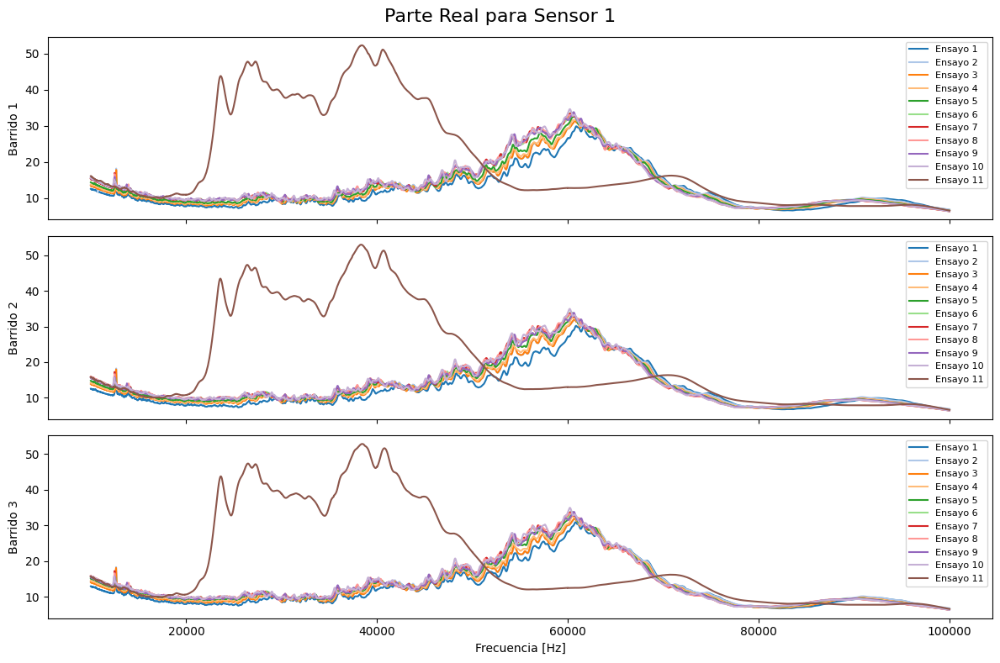

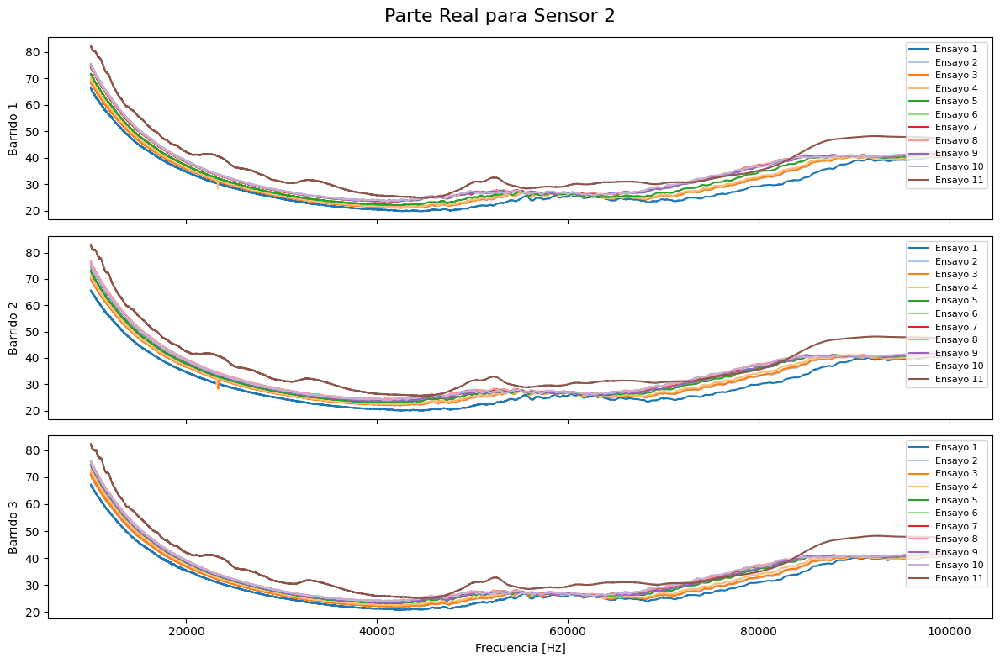

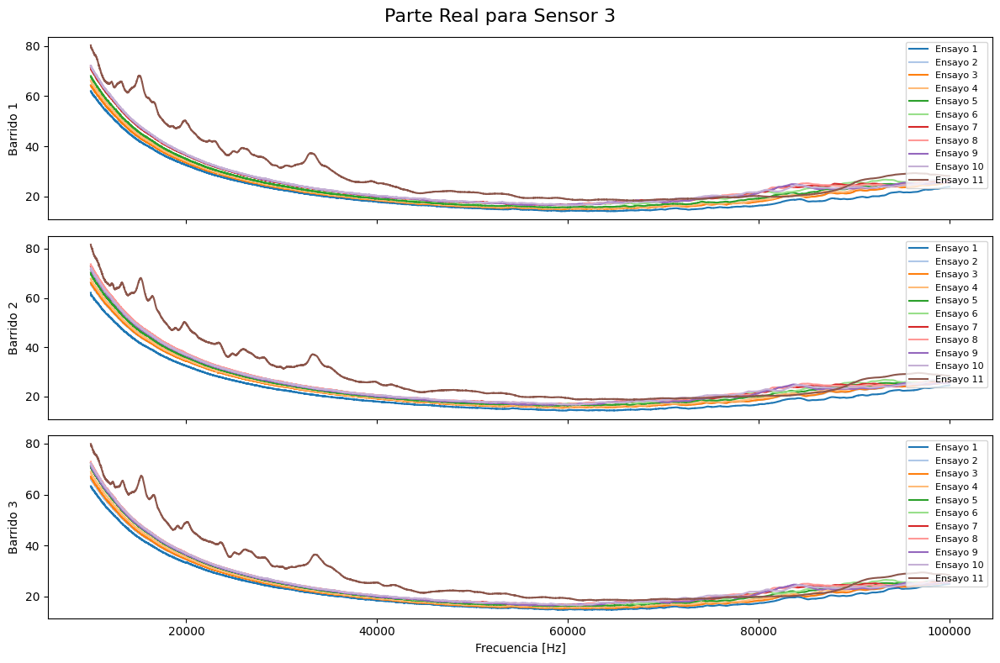

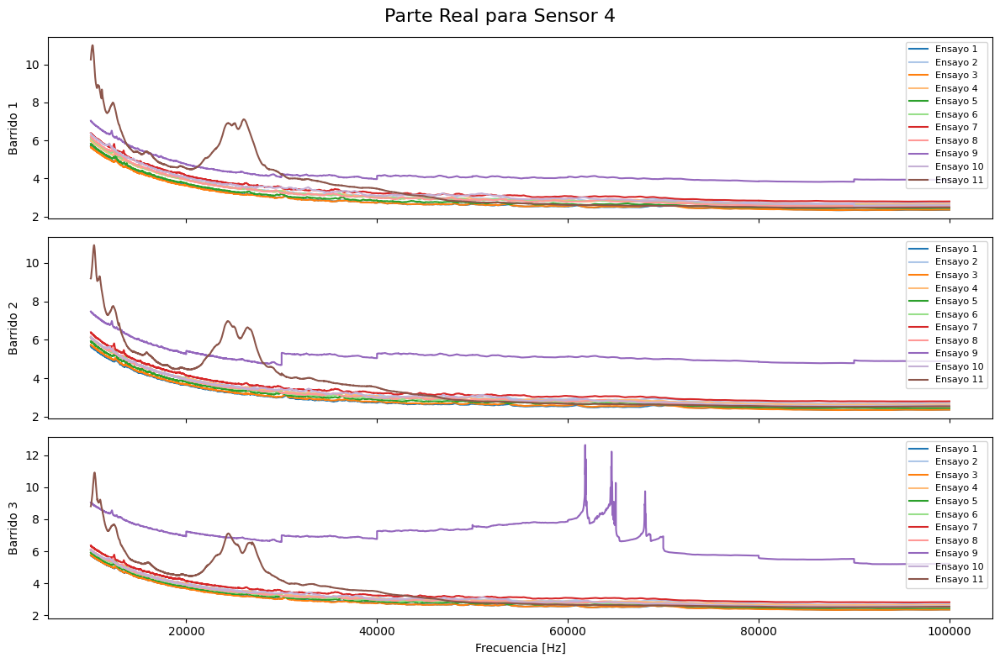

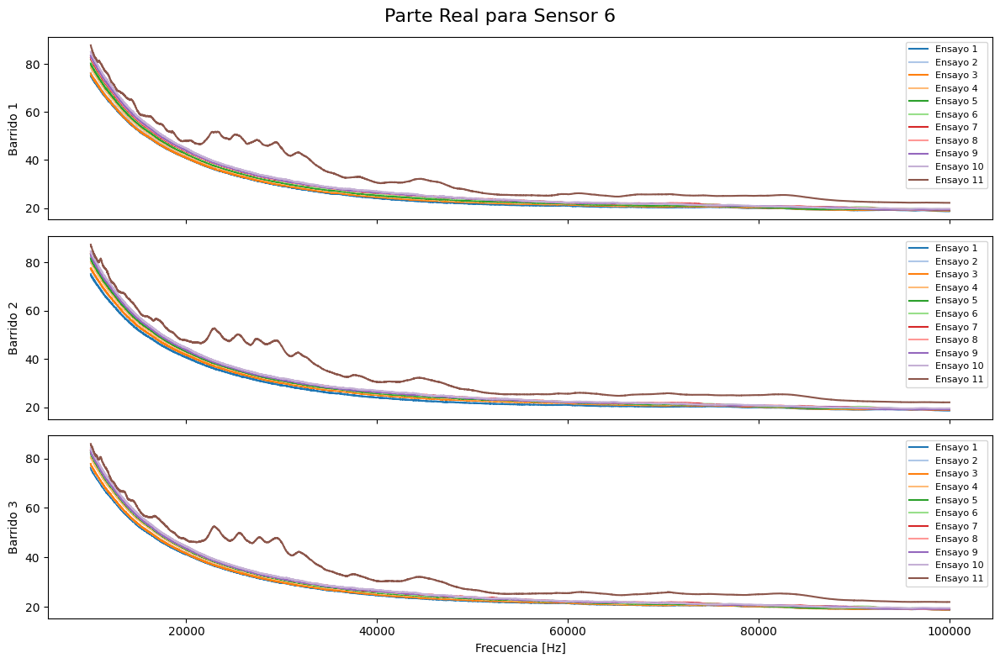

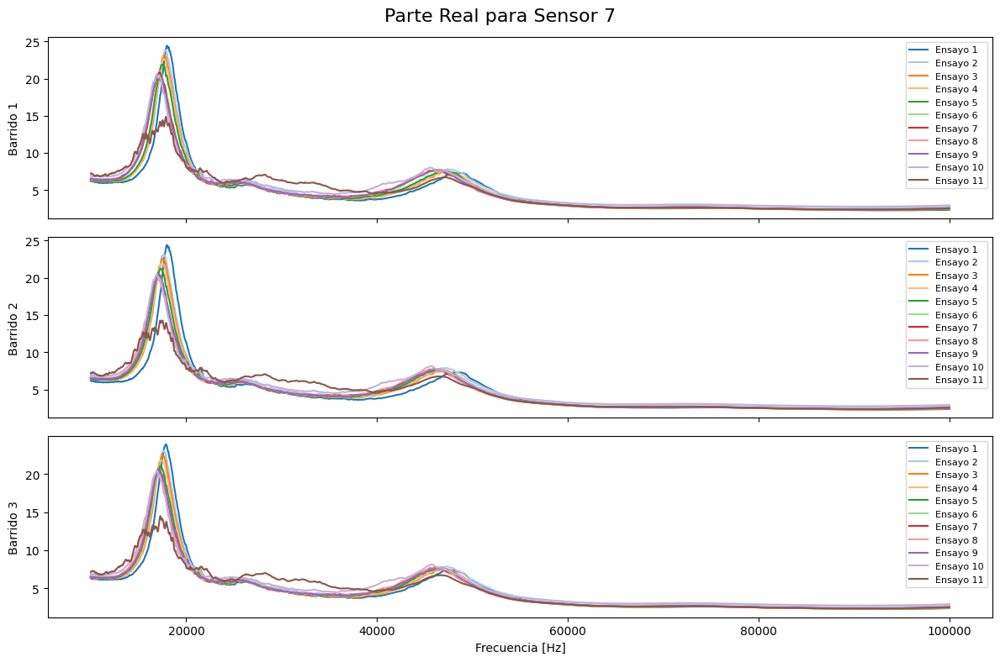

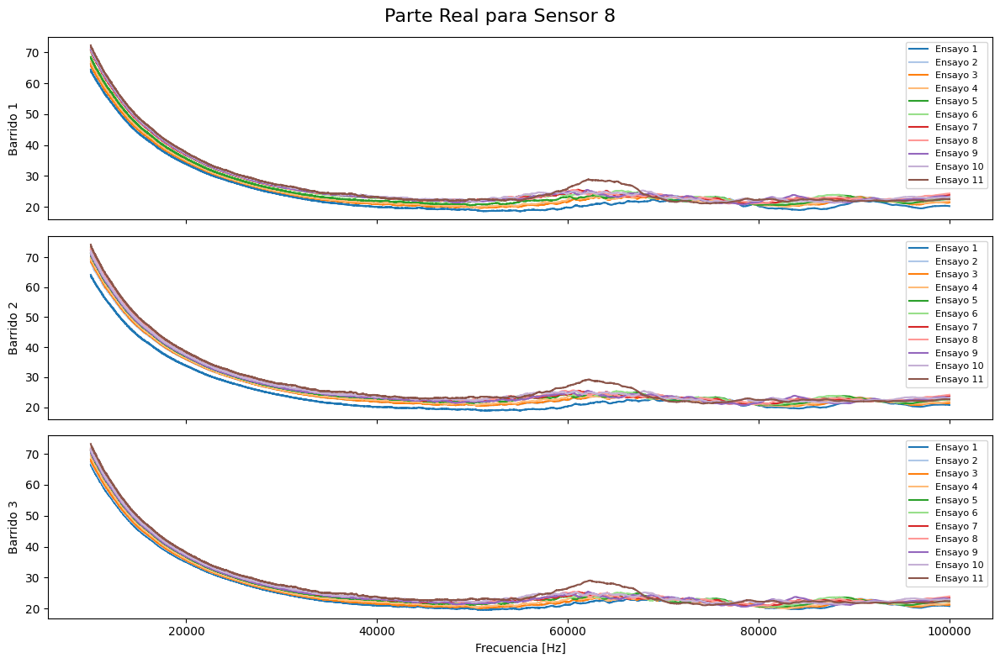

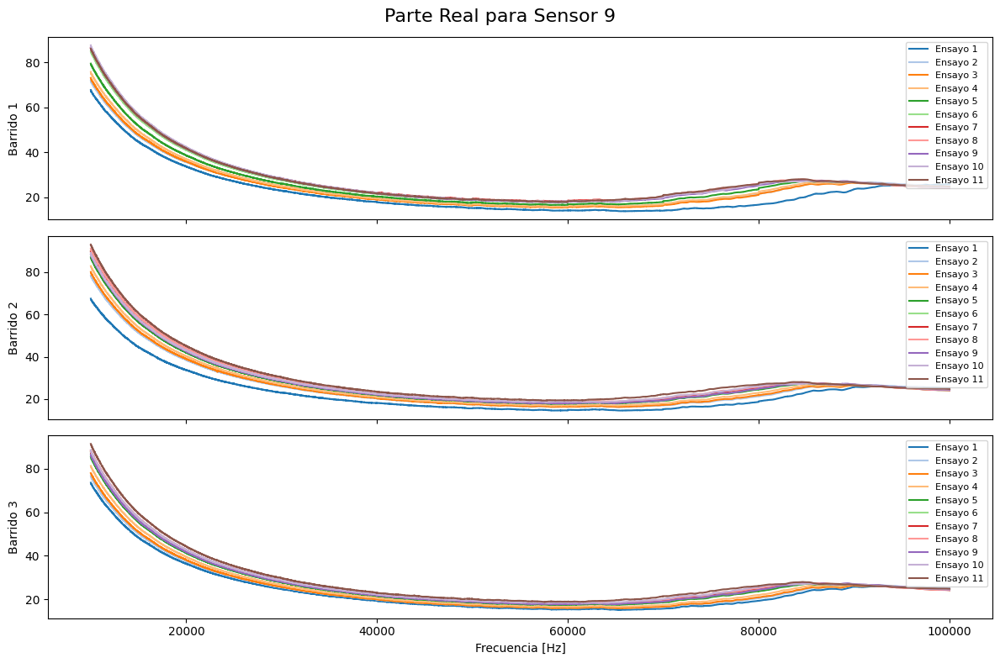

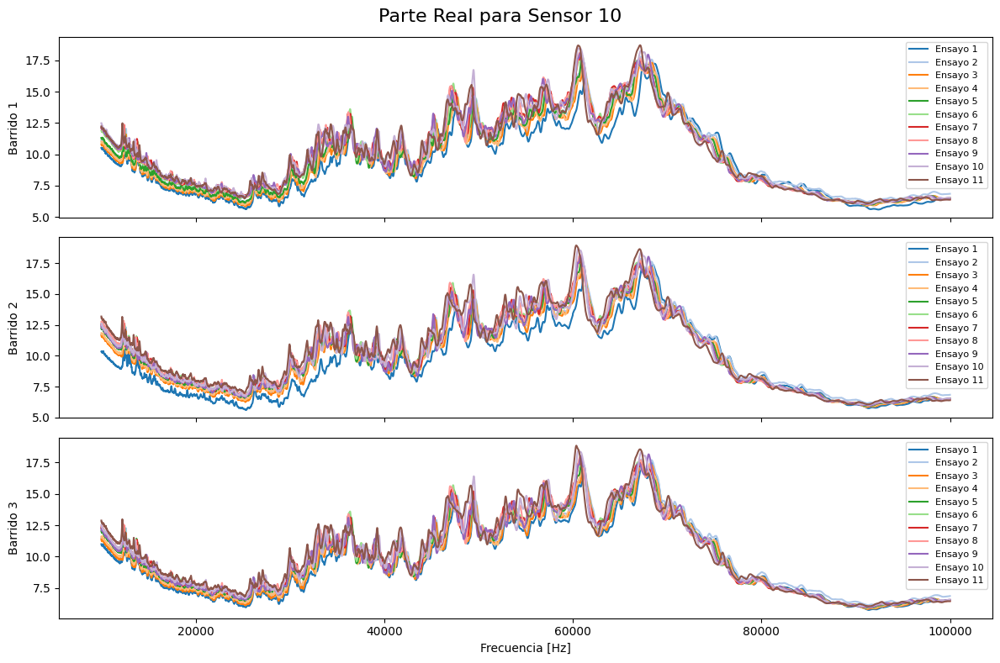

In [50]:
#VISUALIZACIÓN DE SEÑALES: Subplots de las señales separados por sensor, carga y sensor-barrido
n_ensayos, n_barridos, n_sensores, n_puntos = (11, 3, 9, 7209)
colormap = plt.get_cmap("tab20")
# Parte real
for sensor in range(n_sensores):
    fig, axs = plt.subplots(n_barridos, 1, figsize=(12, 8), sharex=True) # Creamos una figura con n_barridos subplots (uno por cada barrido).
    if sensor<4:
        fig.suptitle(f"Parte Real para Sensor {sensor+1}", fontsize=16)
    else: fig.suptitle(f"Parte Real para Sensor {sensor+2}", fontsize=16)
    
    # Iteramos sobre cada barrido
    for barrido in range(n_barridos):
        ax = axs[barrido]  
        for ensayo in range(n_ensayos):
            color = colormap(ensayo % 20)
            ax.plot(data_frecuencias_np_vis,data_partes_reales_np_vis[ensayo, barrido, sensor], label=f"Ensayo {ensayo+1}", color=color)
        
        ax.set_ylabel(f"Barrido {barrido+1}")
        ax.legend(fontsize=8, loc="upper right")
    
    axs[-1].set_xlabel("Frecuencia [Hz]")
    plt.tight_layout()
    plt.show()

In [25]:
# #Parte imaginaria
# for sensor in range(n_sensores):
#     fig, axs = plt.subplots(n_barridos, 1, figsize=(12, 8), sharex=True) # Creamos una figura con n_barridos subplots (uno por cada barrido).
#     if sensor<4:
#         fig.suptitle(f"Parte Imaginaria para Sensor {sensor+1}", fontsize=16)
#     else: fig.suptitle(f"Parte Imaginaria para Sensor {sensor+2}", fontsize=16)
    
#     # Iteramos sobre cada barrido
#     for barrido in range(n_barridos):
#         ax = axs[barrido]  
#         for ensayo in range(n_ensayos):
#             color = colormap(ensayo % 20)
#             ax.plot(data_frecuencias_np_reshaped,data_partes_imagin_np_reshaped[ensayo, barrido, sensor, :], label=f"Ensayo {ensayo+1}",color=color)
        
#         ax.set_ylabel(f"Barrido {barrido+1}")
#         ax.legend(fontsize=8, loc="upper right")
    
#     axs[-1].set_xlabel("Frecuencia [Hz]")
#     plt.tight_layout()
#     plt.show()

In [69]:
# Debido a lo visto en la visualización de los datos, descartamos las señales obtenidas por el ensayo 11 en general y las del ensayo 9 en el caso del sensor 4.
# Esta útima se elimina más adelante antes de entrenar nuestro VAE ya que ahora no se puede por incompatibilidad en el array numpy. Sin embargo nos deshacemos de ella ya en la visualización.
data_partes_reales_npf=np.delete(data_partes_reales_np, 10, axis=0)
print(data_partes_reales_npf.shape)
data_partes_imagin_npf=np.delete(data_partes_imagin_np, 10, axis=0)
print(data_partes_imagin_npf.shape)

(10, 3, 9, 9, 801)
(10, 3, 9, 9, 801)


In [70]:
data_partes_reales_npf_vis = data_partes_reales_npf.reshape(data_partes_reales_npf.shape[0], data_partes_reales_npf.shape[1], data_partes_reales_npf.shape[2], -1)
print(data_partes_reales_npf_vis.shape)

(10, 3, 9, 7209)


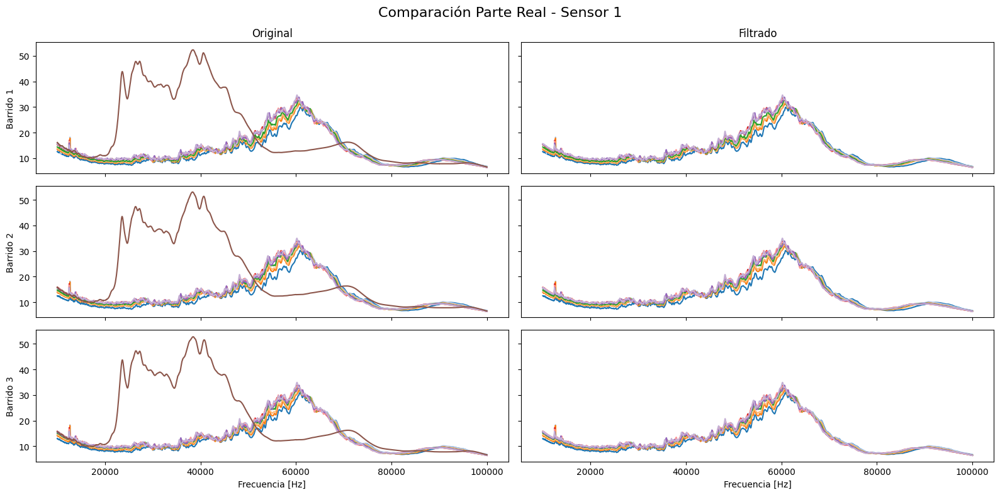

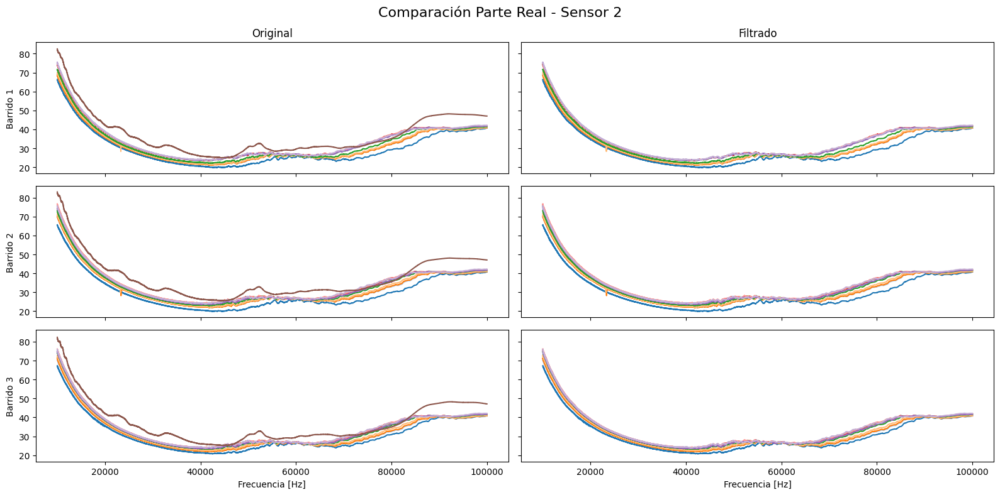

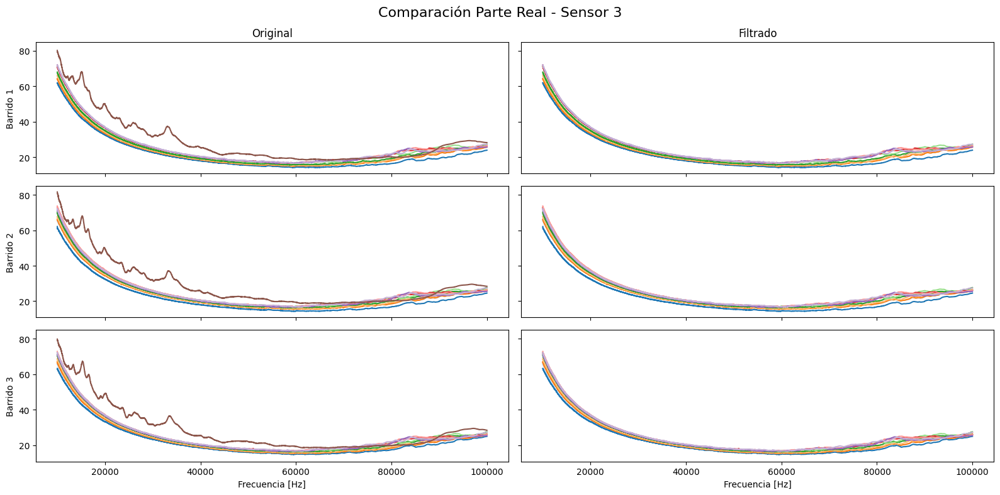

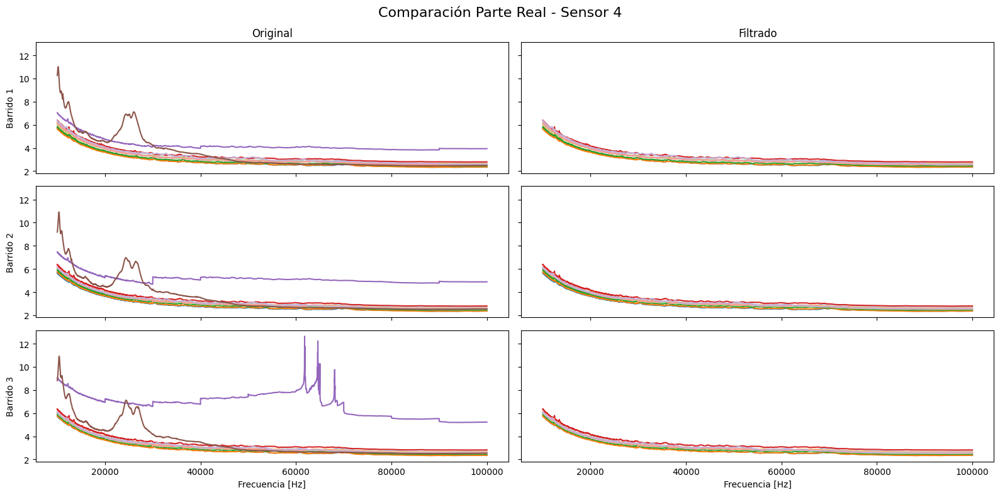

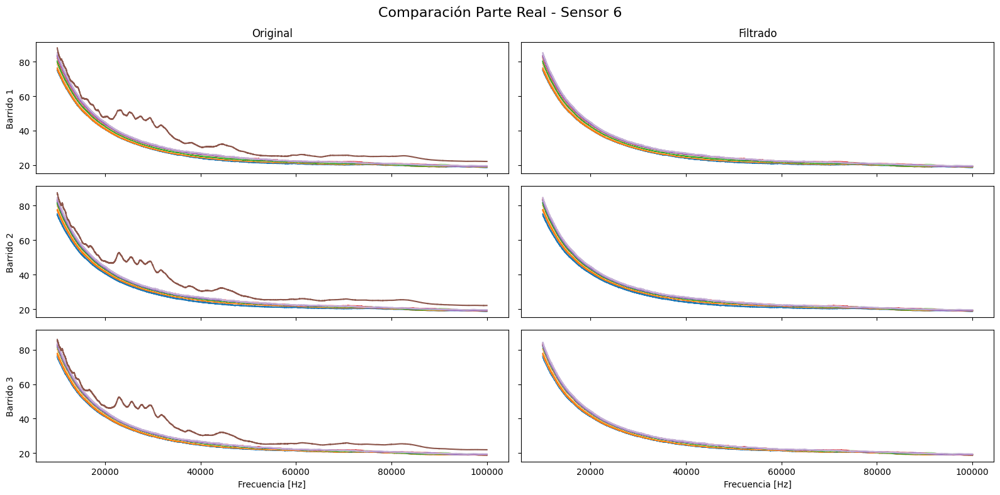

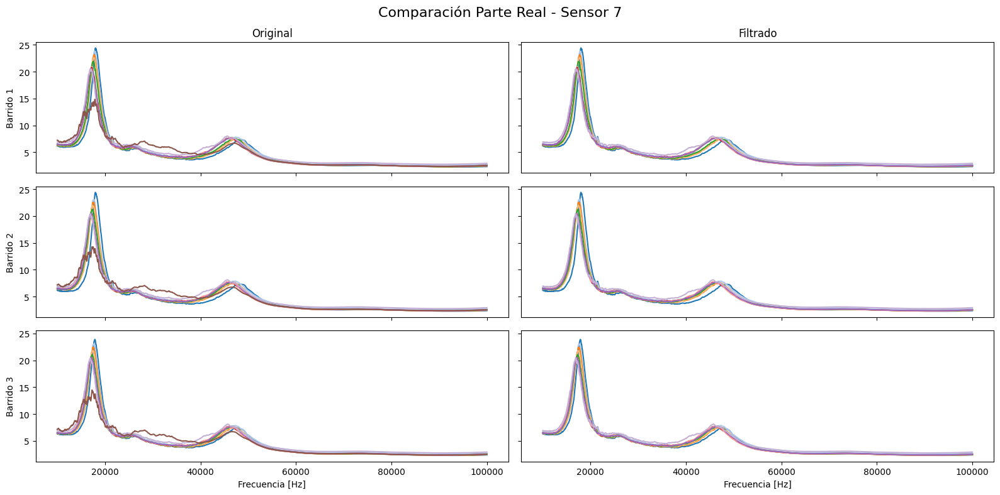

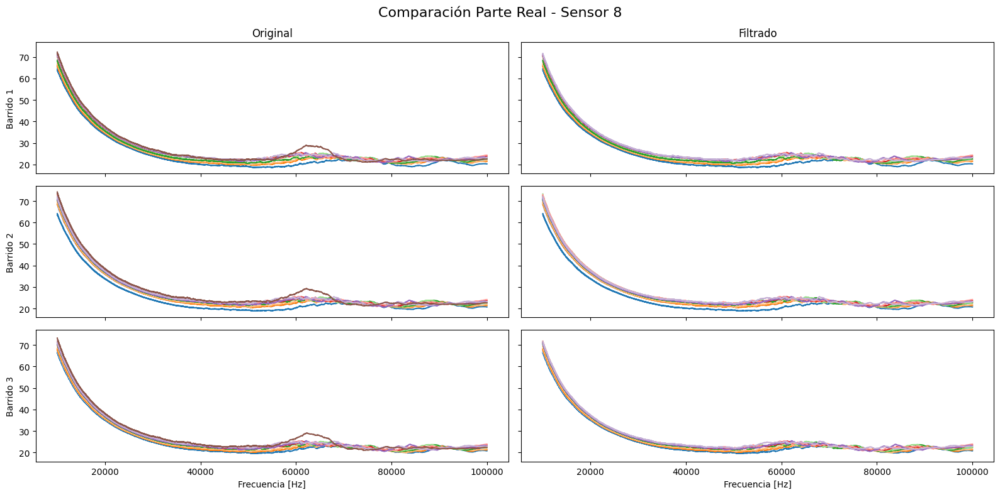

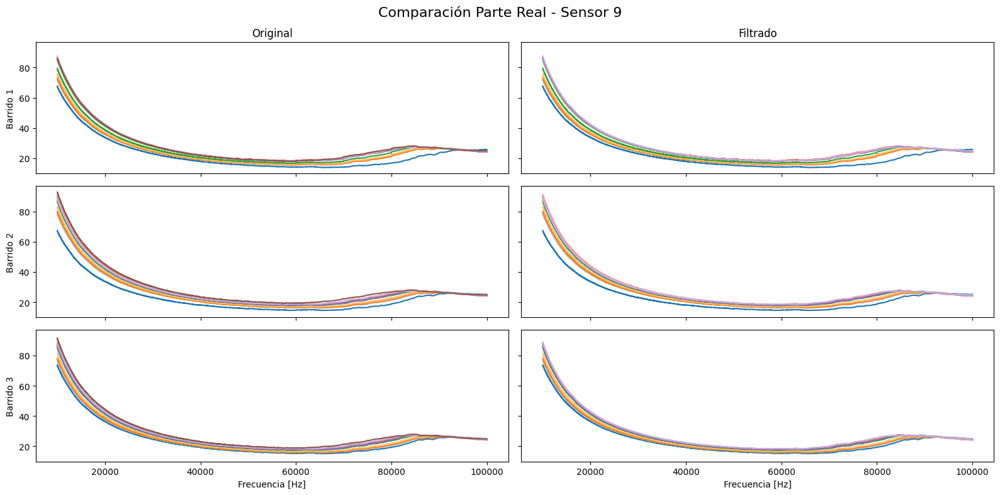

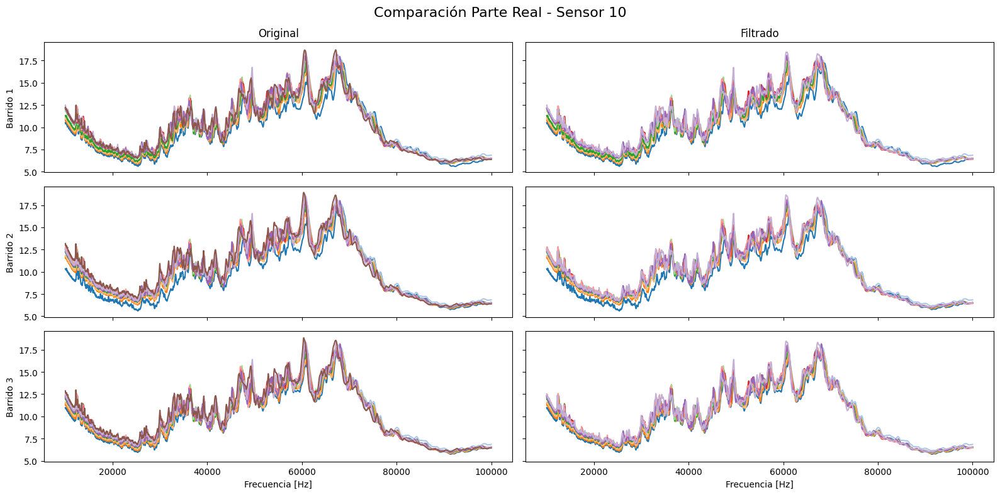

In [77]:
# VISUALIZACIÓN COMPARATIVA
# ---------------------------
n_ensayos_orig, n_barridos, n_sensores, n_puntos = (11, 3, 9, 7209)
n_ensayos_edit = 10
colormap = plt.get_cmap("tab20")

for sensor in range(n_sensores):
    fig, axs = plt.subplots(n_barridos, 2, figsize=(16, 8), sharex=True, sharey=True)  
    # 2 columnas: izquierda original, derecha editada

    if sensor < 4:
        fig.suptitle(f"Comparación Parte Real - Sensor {sensor+1}", fontsize=16)
    else:
        fig.suptitle(f"Comparación Parte Real - Sensor {sensor+2}", fontsize=16)

    for barrido in range(n_barridos):
        # --- Columna izquierda: señales originales ---
        ax_left = axs[barrido, 0]
        for ensayo in range(n_ensayos_orig):
            color = colormap(ensayo % 20)
            ax_left.plot(data_frecuencias_np_vis, 
                         data_partes_reales_np_vis[ensayo, barrido, sensor], 
                         label=f"Ensayo {ensayo+1}", color=color)
        ax_left.set_ylabel(f"Barrido {barrido+1}")
        if barrido == 0:
            ax_left.set_title("Original")

        # --- Columna derecha: señales editadas ---
        ax_right = axs[barrido, 1]
        for ensayo in range(n_ensayos_edit):
            if ensayo == 8 and sensor == 3:  # saltar sensor 4 en ensayo 9
                continue
            color = colormap(ensayo % 20)
            ax_right.plot(data_frecuencias_np_vis, 
                          data_partes_reales_npf_vis[ensayo, barrido, sensor], 
                          label=f"Ensayo {ensayo+1}", color=color)
        if barrido == 0:
            ax_right.set_title("Filtrado")

    axs[-1, 0].set_xlabel("Frecuencia [Hz]")
    axs[-1, 1].set_xlabel("Frecuencia [Hz]")

    plt.tight_layout()
    plt.show()


In [78]:
data_partes_reales_np_reshaped=data_partes_reales_npf.reshape(10, 3, 9, 81, 89)
data_partes_reales_np_reshaped.shape

(10, 3, 9, 81, 89)

In [79]:
data_partes_imagin_np_reshaped=data_partes_imagin_npf.reshape(10, 3, 9, 81, 89)
data_partes_imagin_np_reshaped.shape

(10, 3, 9, 81, 89)

In [37]:
data_partes_reales_tensor = torch.tensor(data_partes_reales_np_reshaped, dtype=torch.float32)
data_partes_imagin_tensor = torch.tensor(data_partes_imagin_np_reshaped, dtype=torch.float32)
freqs_tensor = torch.tensor(data_frecuencias_np_vis, dtype=torch.float32)
torch.save(data_partes_reales_tensor, 'tensor_emis_real_corto.pt')
torch.save(data_partes_imagin_tensor, 'tensor_emis_imagin_corto.pt')
torch.save(freqs_tensor, 'freqs_emis_corto.pt')

In [4]:
data_partes_reales_tensor=torch.load('tensor_emis_real_corto.pt')
data_partes_imagin_tensor=torch.load('tensor_emis_imagin_corto.pt')
freqs_tensor=torch.load('freqs_emis_corto.pt')

# Definición del Autoencoder Variacional (VAE)
class VariationalAutoencoder(nn.Module):
    def __init__(self, latent_dim):
        super().__init__()
        self.latent_dim = latent_dim
        
        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv1d(1, 32, 3, stride=2, padding=2),
            nn.ReLU(),
            nn.Conv1d(32, 32, 3, stride=2, padding=2),
            nn.ReLU(),
            nn.Conv1d(32, 64, 3, stride=2, padding=2),
            nn.ReLU(),
            nn.Conv1d(64, 64, 3, stride=2, padding=2),
            nn.ReLU(),
            nn.Conv1d(64, 128, 3, stride=2, padding=2),
            nn.ReLU(),
            nn.Conv1d(128, 128, 3, stride=2, padding=2),
            nn.ReLU()
        )
        
       # Obtener tamaño de salida del encoder dinámicamente
        with torch.no_grad():
            sample_input = torch.randn(1, 1, 89)
            sample_cat = torch.randn(1,81)
            sample_output = self.encoder(sample_input)
            encoded_dim = sample_output.numel() // sample_output.shape[0]
            # print(encoded_dim)

        self.fc_mu = nn.Linear(encoded_dim, latent_dim)
        self.fc_logvar = nn.Linear(encoded_dim, latent_dim)
        # Decoder
        self.decoder_fc = nn.Linear(latent_dim, encoded_dim)
        self.decoder = nn.Sequential(
            nn.ConvTranspose1d(128, 128, 3, stride=2, padding=2, output_padding=0),
            nn.ReLU(),
            nn.ConvTranspose1d(128, 64, 3, stride=2, padding=2, output_padding=1),
            nn.ReLU(),
            nn.ConvTranspose1d(64, 64, 3, stride=2, padding=2, output_padding=0),
            nn.ReLU(),
            nn.ConvTranspose1d(64, 32, 3, stride=2, padding=2, output_padding=1),
            nn.ReLU(),
            nn.ConvTranspose1d(32, 32, 3, stride=2, padding=2, output_padding=1),
            nn.ReLU(),
            nn.ConvTranspose1d(32, 1, 3, stride=2, padding=2),
            nn.Sigmoid()
        )
    
    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std
    
    def forward(self, x):
        x = self.encoder(x)
        x = x.view(x.size(0), -1)  # Aplanamos
        #print(f"Tamaño después del encoder: {x.shape}")  # Depuración
        
        mu = self.fc_mu(x)
        logvar = self.fc_logvar(x)
        z = self.reparameterize(mu, logvar)
        
        x = self.decoder_fc(z).view(x.size(0), 128, -1)
        x = self.decoder(x)
        return x, mu, logvar

In [5]:
print(data_partes_reales_tensor.shape)
print(data_partes_imagin_tensor.shape)

torch.Size([10, 3, 9, 81, 89])
torch.Size([10, 3, 9, 81, 89])


In [6]:
latent_dim=2
model = VariationalAutoencoder(latent_dim)
summary(model, input_size=(64, 1, 89))

Layer (type:depth-idx)                   Output Shape              Param #
VariationalAutoencoder                   [64, 1, 89]               --
├─Sequential: 1-1                        [64, 128, 4]              --
│    └─Conv1d: 2-1                       [64, 32, 46]              128
│    └─ReLU: 2-2                         [64, 32, 46]              --
│    └─Conv1d: 2-3                       [64, 32, 24]              3,104
│    └─ReLU: 2-4                         [64, 32, 24]              --
│    └─Conv1d: 2-5                       [64, 64, 13]              6,208
│    └─ReLU: 2-6                         [64, 64, 13]              --
│    └─Conv1d: 2-7                       [64, 64, 8]               12,352
│    └─ReLU: 2-8                         [64, 64, 8]               --
│    └─Conv1d: 2-9                       [64, 128, 5]              24,704
│    └─ReLU: 2-10                        [64, 128, 5]              --
│    └─Conv1d: 2-11                      [64, 128, 4]              49,

In [12]:
learning_rate = 1e-3 # Determina qué tan grandes son los ajustes en los parámetros del modelo después de cada lote o época.
batch_size = 64 # Es la cantidad de datos que se pasan por la red antes de actualizar los parámetros
epochs = 100 # Una época es una pasada completa por todo el dataset de entrenamiento
def loss_fn(outputs, inputs, mu, logvar, beta=0.05):
    mse = (outputs - inputs) ** 2  # Calcula el error cuadrático

    # Reducción lotes/muestras con mean
    loss_0= torch.mean(mse, dim=0)
    
    # Reducción secuencia/longitud con sum
    loss_2 = torch.sum(mse, dim=2)
    
    recon_loss = torch.sum(loss_2) + torch.sum(loss_0)
    
    kl_divergence = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    total_loss= recon_loss + beta * kl_divergence
    return total_loss, recon_loss, beta*kl_divergence
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

In [13]:
def scale_signal(signal):
    # signal: tensor [num_channels, sequence_length] o [batch, L]
    min_val = signal.min(dim=-1, keepdim=True)[0]
    max_val = signal.max(dim=-1, keepdim=True)[0]
    scaled = (signal - min_val) / (max_val - min_val + 1e-8)
    return scaled

In [14]:
# ---- Eliminar ensayo 9 (ensayo_local=7) y sensor 4 (sensor=3) ----
indices_a_eliminar = []
ensayo_local = 8  # ensayo 9 en el bloque de loads
sensor = 3        # sensor 4 (indexado desde 0)

for barrido in range(3):       # 3 barridos
    for rango in range(81):    # 81 rangos
        idx = (((ensayo_local * 3 + barrido) * 9 + sensor) * 81 + rango)
        indices_a_eliminar.append(idx)

indices_a_eliminar = torch.tensor(indices_a_eliminar, dtype=torch.long)
data=data_partes_reales_tensor.view(-1, 1, 89)

# Crear máscara y filtrar
mask = torch.ones(data.shape[0], dtype=torch.bool)
mask[indices_a_eliminar] = False
data_filtrado = data[mask]

print("Shape original:", data.shape)
print("Shape filtrado:", data_filtrado.shape)

data_scaled = scale_signal(data_filtrado)

print(data_scaled.shape)

train_dataset = TensorDataset(data_scaled)
test_dataset = TensorDataset(data_scaled)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True)

Shape original: torch.Size([21870, 1, 89])
Shape filtrado: torch.Size([21627, 1, 89])
torch.Size([21627, 1, 89])


Época 1/100, Pérdida: 89.778638, Pérdida Reconstrucción: 75.799153
Época 2/100, Pérdida: 88.270701, Pérdida Reconstrucción: 74.292086
Época 3/100, Pérdida: 86.660018, Pérdida Reconstrucción: 72.649591
Época 4/100, Pérdida: 85.404740, Pérdida Reconstrucción: 71.243209
Época 5/100, Pérdida: 84.193505, Pérdida Reconstrucción: 69.881121
Época 6/100, Pérdida: 82.497450, Pérdida Reconstrucción: 68.096633
Época 7/100, Pérdida: 80.809752, Pérdida Reconstrucción: 66.286361
Época 8/100, Pérdida: 79.605053, Pérdida Reconstrucción: 64.927269
Época 9/100, Pérdida: 79.157941, Pérdida Reconstrucción: 64.336527
Época 10/100, Pérdida: 77.967983, Pérdida Reconstrucción: 63.059894
Época 11/100, Pérdida: 77.298342, Pérdida Reconstrucción: 62.339093
Época 12/100, Pérdida: 76.808783, Pérdida Reconstrucción: 61.733807
Época 13/100, Pérdida: 76.538677, Pérdida Reconstrucción: 61.356628
Época 14/100, Pérdida: 75.134373, Pérdida Reconstrucción: 59.970594
Época 15/100, Pérdida: 75.104561, Pérdida Reconstrucción:

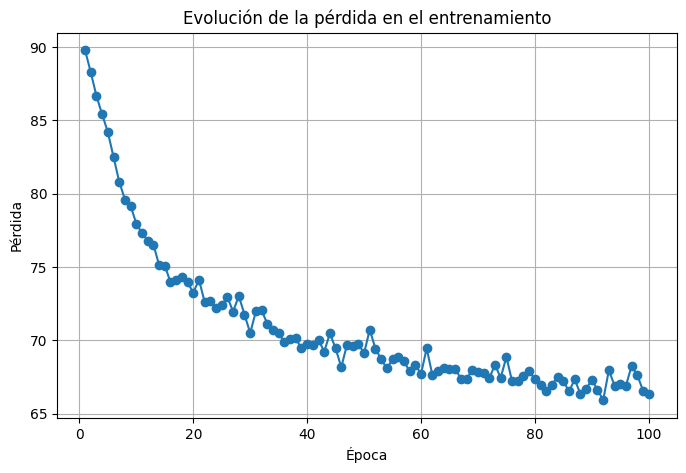

[89.77863808355387,
 88.27070127859623,
 86.66001761171239,
 85.40474011347844,
 84.19350503323346,
 82.49745047304052,
 80.8097524473653,
 79.60505320757804,
 79.15794057676779,
 77.96798332485221,
 77.29834189781776,
 76.80878339011288,
 76.53867696728227,
 75.13437251931816,
 75.10456129220816,
 73.96918433375612,
 74.12516187633989,
 74.32838760466265,
 73.97046108358711,
 73.24667242151746,
 74.14059104016546,
 72.62728985667934,
 72.70704728752904,
 72.17941364310903,
 72.4117632758688,
 72.95429478030233,
 71.96545592990853,
 73.03517142978646,
 71.76372396028958,
 70.5133283829548,
 71.97378195813421,
 72.06337938929451,
 71.14248468748916,
 70.70619419481628,
 70.52417924418252,
 69.87125350455561,
 70.11989345211954,
 70.1424885247586,
 69.45497482344949,
 69.77843210118762,
 69.69228660989795,
 70.0502064834685,
 69.23596324582071,
 70.48477035161307,
 69.45459296999599,
 68.1792813250299,
 69.70263964184643,
 69.61092987286268,
 69.78148122934195,
 69.12272243386894,
 70.73

In [15]:
# Entrenamiento del modelo
def train_model(model, train_loader, optimizer, epochs):
    losses = []
    recon_losses= []
    for epoch in range(epochs):
        model.train()
        epoch_loss = 0
        reconepoch_loss=0
        for batch in train_loader:
            inputs = batch[0]
            outputs, mu, logvar = model(inputs)
            loss, recon_loss, kl_loss = loss_fn(outputs, inputs, mu, logvar)
            
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
            epoch_loss += loss.item()
            reconepoch_loss += recon_loss.item()
            # klepoch_loss += kl_loss.item()
        avg_loss = epoch_loss / len(train_loader)
        losses.append(avg_loss)
        avgrecon_loss = reconepoch_loss / len(train_loader)
        recon_losses.append(avgrecon_loss)
        print(f"Época {epoch+1}/{epochs}, Pérdida: {avg_loss:.6f}, Pérdida Reconstrucción: {avgrecon_loss:.6f}")
    # Guardar pesos al final
    ruta = f"vae_T.pth"
    torch.save(model.state_dict(), ruta)
    print(f"Modelo guardado en {ruta}")
     # ---- 📈 Graficar curva de pérdida ----
    plt.figure(figsize=(8, 5))
    plt.plot(range(1, epochs+1), losses, marker="o", linestyle="-")
    plt.xlabel("Época")
    plt.ylabel("Pérdida")
    plt.title("Evolución de la pérdida en el entrenamiento")
    plt.grid(True)
    plt.show()

    return losses

train_model(model, train_loader, optimizer, epochs)

In [17]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.load_state_dict(torch.load(f"vae_T.pth", map_location=device))

<All keys matched successfully>

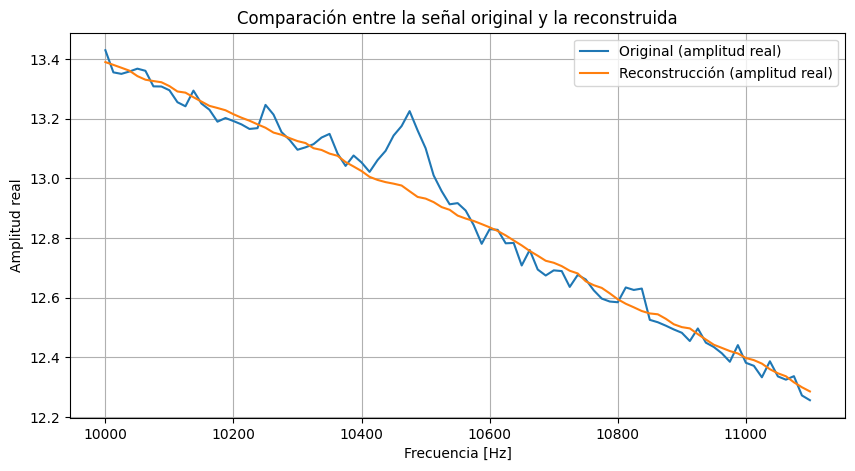

In [29]:
def evaluate_model(model, loads_scaled, loads_original, freqs_tensor):

    model.eval()
    with torch.no_grad():
        # Tomamos la primera señal (index 0)
        original_signal_scaled = loads_scaled[0]       # [1, 89]
        original_signal_real = loads_original[0]       # [1, 89]

        # Extraer las frecuencias correspondientes a esa señal
        freqs_signal = freqs_tensor[:original_signal_real.shape[-1]]  # primeros 89 valores

        # Reconstrucción
        reconstructed_scaled = model(original_signal_scaled.unsqueeze(0))[0].squeeze().detach()

        # Desnormalizar usando min y max de la señal real
        min_val = original_signal_real.min()
        max_val = original_signal_real.max()
        reconstructed_real = reconstructed_scaled * (max_val - min_val) + min_val

        # Graficar
        plt.figure(figsize=(10, 5))
        plt.plot(freqs_signal.numpy(), original_signal_real.squeeze().numpy(), label="Original (amplitud real)")
        plt.plot(freqs_signal.numpy(), reconstructed_real.numpy(), label="Reconstrucción (amplitud real)")
        plt.legend()
        plt.title("Comparación entre la señal original y la reconstruida")
        plt.xlabel("Frecuencia [Hz]")
        plt.ylabel("Amplitud real")
        plt.grid(True)
        plt.show()

# Ejemplo de uso
evaluate_model(model, data_scaled, data_filtrado, freqs_tensor)



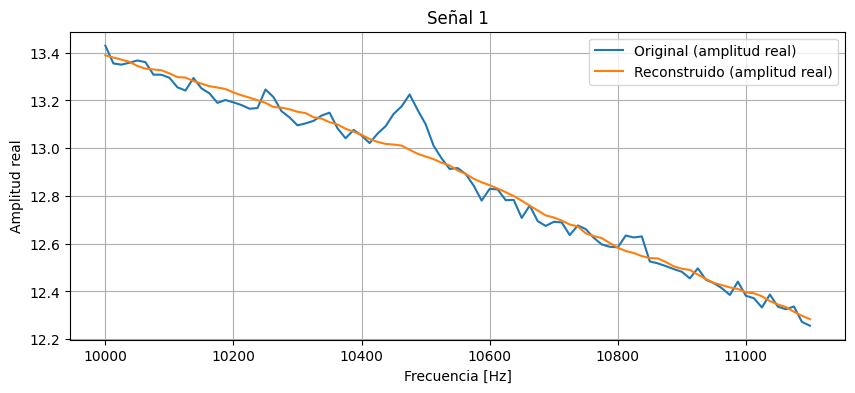

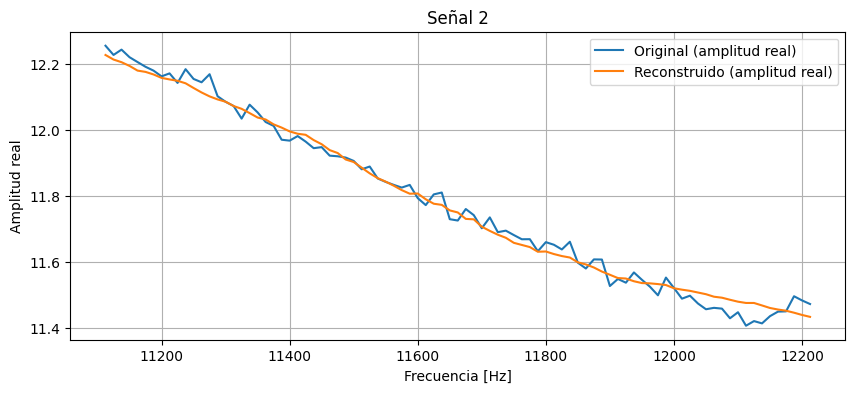

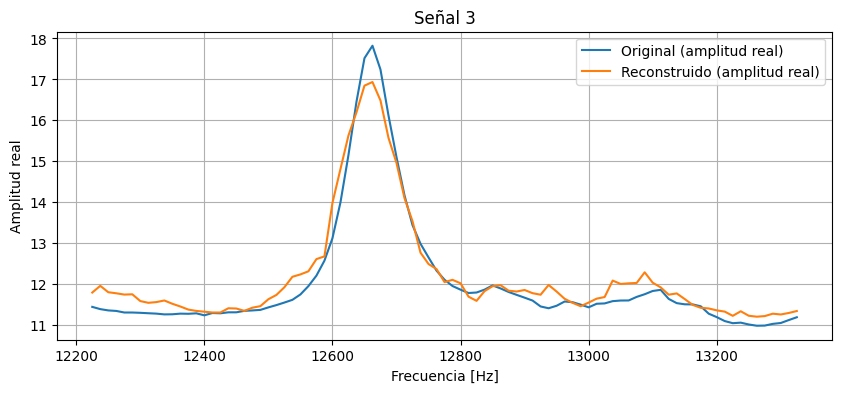

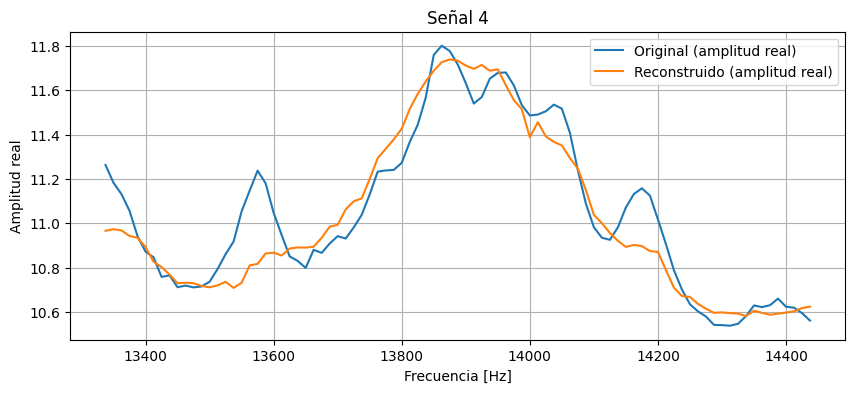

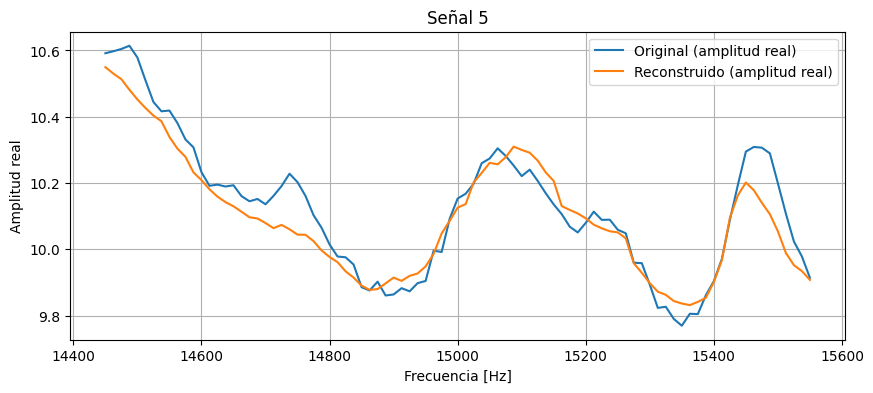

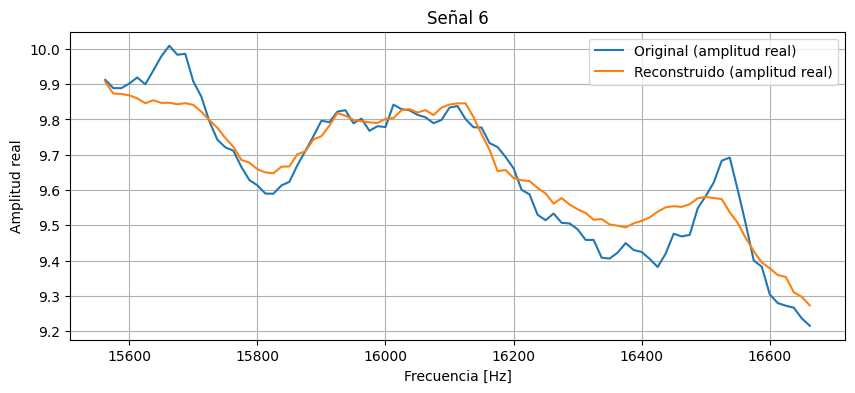

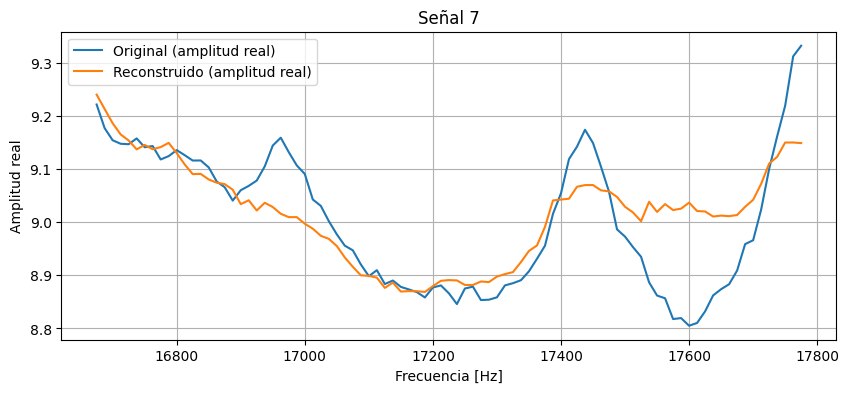

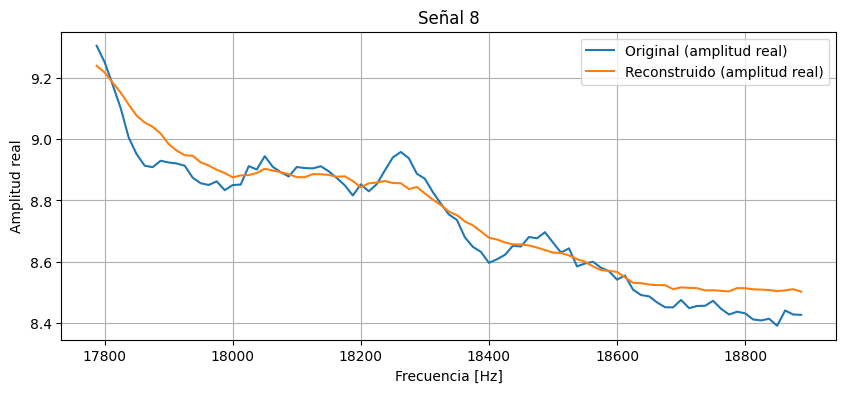

In [30]:
def evaluate_test_signals(model, test_data_scaled, test_data_real, freqs_tensor):
    model.eval()
    with torch.no_grad():
        for i, (scaled_signal, real_signal) in enumerate(zip(test_data_scaled[:8], test_data_real[:8])):
            # Índices para extraer el bloque de frecuencias de esta señal
            start_idx = i * real_signal.shape[-1]  # i * 89
            end_idx = start_idx + real_signal.shape[-1]
            freqs_signal = freqs_tensor[start_idx:end_idx]  # [89]

            # Paso por el modelo con la señal normalizada
            input_tensor = scaled_signal.unsqueeze(0)  # [1, 1, 89]
            reconstructed_scaled = model(input_tensor)[0].squeeze().detach()  # [89]

            # Des-normalización usando min y max de la señal real correspondiente
            min_val = real_signal.min()
            max_val = real_signal.max()
            reconstructed_real = reconstructed_scaled * (max_val - min_val) + min_val

            # Graficar
            plt.figure(figsize=(10, 4))
            plt.plot(freqs_signal, real_signal.squeeze().numpy(), label='Original (amplitud real)')
            plt.plot(freqs_signal, reconstructed_real.numpy(), label='Reconstruido (amplitud real)')
            plt.title(f"Señal {i+1}")
            plt.legend()
            plt.xlabel("Frecuencia [Hz]")
            plt.ylabel("Amplitud real")
            plt.grid(True)
            plt.show()

# Ejemplo de uso
evaluate_test_signals(model, data_scaled, data_filtrado, freqs_tensor)



In [31]:
def evaluate_single_signal(model, data_scaled, data_original, freqs_tensor,
                           ensayo_index=0, barrido_index=0, sensor_index=0):
    """
    Reconstruye y visualiza UNA señal completa (7209 puntos)
    de un ensayo, barrido y sensor específicos, usando data_scaled
    que contiene baseline + cargas (10 ensayos).
    """
    model.eval()
    with torch.no_grad():
        # ---- Calcular índices ----
        signal_idx = barrido_index * 9 + sensor_index  # 0..26 dentro del ensayo
        global_signal_index = ensayo_index * 27 + signal_idx  # posición global de la señal

        # Cada señal está formada por 81 bloques de 89 puntos
        start_block = global_signal_index * 81
        end_block = start_block + 81

        scaled_blocks = data_scaled[start_block:end_block]   # [81, 1, 89]
        real_blocks   = data_original[start_block:end_block] # [81, 1, 89]

        reconstructed_blocks = []
        original_blocks = []

        # ---- Pasar cada bloque por el modelo ----
        for scaled_signal, real_signal in zip(scaled_blocks, real_blocks):
            input_tensor = scaled_signal.unsqueeze(0)  # [1, 1, 89]
            reconstructed_scaled = model(input_tensor)[0].squeeze().detach()  # [89]

            # Desnormalizar con min/max del bloque real
            min_val = real_signal.min()
            max_val = real_signal.max()
            reconstructed_real = reconstructed_scaled * (max_val - min_val) + min_val

            reconstructed_blocks.append(reconstructed_real.cpu().numpy())
            original_blocks.append(real_signal.squeeze().cpu().numpy())

        # ---- Concatenar bloques → señal completa ----
        reconstructed_full = np.concatenate(reconstructed_blocks)
        original_full = np.concatenate(original_blocks)
        freqs_full = freqs_tensor[:original_full.shape[0]]

        # Ajustar etiqueta de sensor (saltando el 5)
        sensor_label = sensor_index + 1 if sensor_index < 4 else sensor_index + 2

        # ---- Graficar ----
        plt.figure(figsize=(12,5))
        plt.plot(freqs_full.numpy(), original_full, label="Original", alpha=0.7)
        plt.plot(freqs_full.numpy(), reconstructed_full, label="Reconstrucción", alpha=0.7)
        plt.title(f"Ensayo {ensayo_index} - Barrido {barrido_index+1} - Sensor {sensor_label}")
        plt.xlabel("Frecuencia")
        plt.ylabel("Amplitud")
        plt.grid(True)
        plt.legend()
        plt.show()


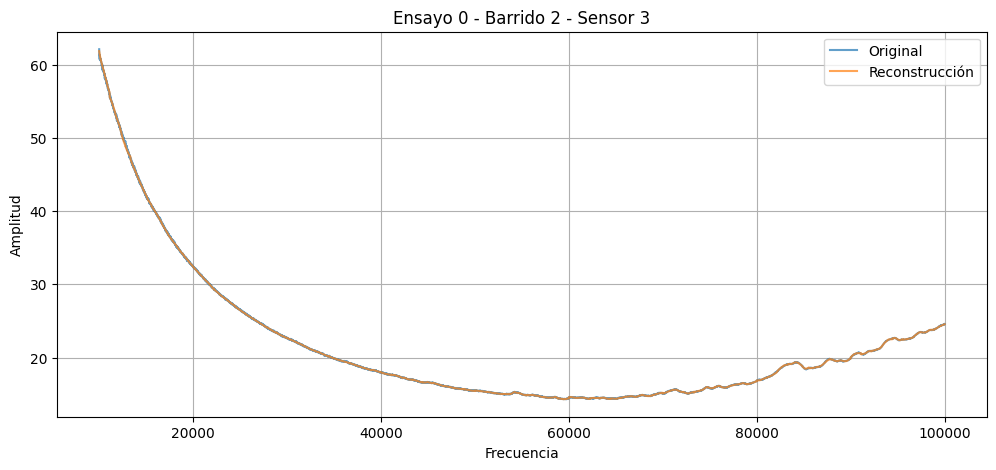

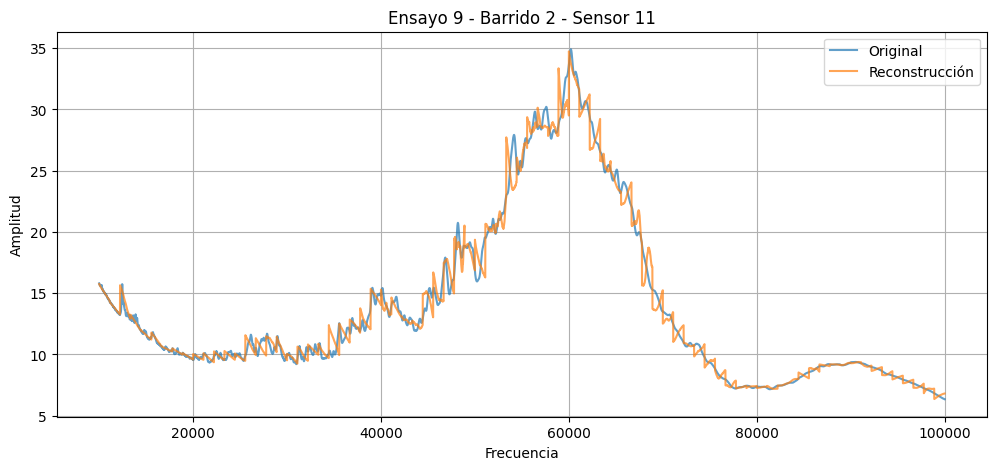

In [32]:
data_scaled = torch.cat([baselineycarga_scaled, loads_scaled], dim=0)
data_original = torch.cat([baselineycarga, loads], dim=0)

evaluate_single_signal(model, data_scaled, data_original, freqs_tensor,
                       ensayo_index=0, barrido_index=1, sensor_index=2)

evaluate_single_signal(model, data_scaled, data_original, freqs_tensor,
                       ensayo_index=9, barrido_index=1, sensor_index=9)


In [33]:
def evaluate_full_ensayo(model, data_scaled, data_original, freqs_tensor, ensayo_index=0):
    """
    Reconstruye y visualiza TODAS las señales completas de un ensayo (27 señales de 7209 puntos),
    mostrando explícitamente el barrido y el sensor.
    Ahora funciona con data_scaled que contiene baseline + cargas (10 ensayos en total).
    """

    model.eval()
    with torch.no_grad():
        fig, axs = plt.subplots(9, 3, figsize=(15, 25), sharex=True)
        axs = axs.flatten()

        for signal_idx in range(27):  # 3 barridos × 9 sensores
            # Calcular barrido y sensor
            barrido = signal_idx // 9   # 0,1,2
            sensor = signal_idx % 9     # 0...8

            # Índice global de la señal dentro de data_scaled
            global_signal_index = ensayo_index * 27 + signal_idx

            # Rango de bloques
            start_block = global_signal_index * 81
            end_block = start_block + 81
            
            scaled_blocks = data_scaled[start_block:end_block]   # [81, 1, 89]
            real_blocks = data_original[start_block:end_block]   # [81, 1, 89]

            reconstructed_blocks = []
            original_blocks = []

            for scaled_signal, real_signal in zip(scaled_blocks, real_blocks):
                # Reconstrucción del bloque
                input_tensor = scaled_signal.unsqueeze(0)  # [1, 1, 89]
                reconstructed_scaled = model(input_tensor)[0].squeeze().detach()  # [89]

                # Desnormalización con min/max del bloque real
                min_val = real_signal.min()
                max_val = real_signal.max()
                reconstructed_real = reconstructed_scaled * (max_val - min_val) + min_val

                reconstructed_blocks.append(reconstructed_real.numpy())
                original_blocks.append(real_signal.squeeze().numpy())

            # Concatenar → señal completa (7209 puntos)
            reconstructed_full = np.concatenate(reconstructed_blocks)
            original_full = np.concatenate(original_blocks)
            freqs_full = freqs_tensor[:original_full.shape[0]]

            # Graficar en subplot correspondiente
            ax = axs[signal_idx]
            ax.plot(freqs_full.numpy(), original_full, label="Original", alpha=0.7)
            ax.plot(freqs_full.numpy(), reconstructed_full, label="Reconstrucción", alpha=0.7)

            # Etiqueta con sensor y barrido (saltando sensor 5)
            sensor_label = sensor + 1 if sensor < 4 else sensor + 2  
            ax.set_title(f"Barrido {barrido+1} - Sensor {sensor_label}", fontsize=9)
            ax.grid(True)


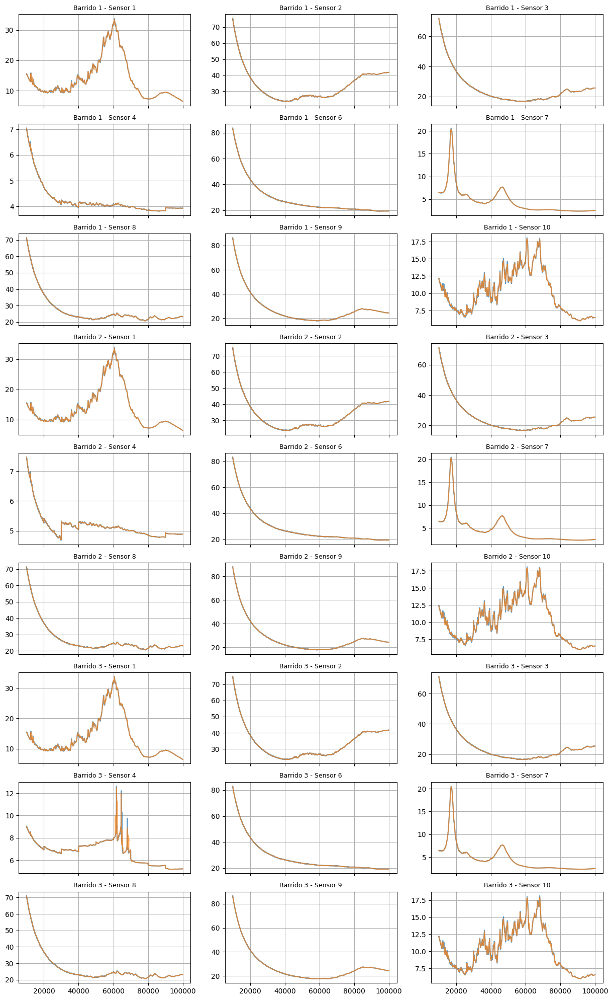

In [34]:
# Ejemplo: visualizar un ensayo de carga
evaluate_full_ensayo(model, data_scaled, data_original, freqs_tensor, ensayo_index=8)


In [35]:
def evaluate_full_signal_with_blocks(model, loads_scaled, loads_original, freqs_tensor, ensayo_index=0, signal_idx=0):
    """
    Visualiza una señal completa (7209 puntos) en filas de bloques:
    - Izquierda: bloque de 89 puntos (original vs reconstrucción).
    - Derecha: señal completa (7209 puntos) con el bloque resaltado.
    
    ensayo_index: ensayo que queremos visualizar
    signal_idx: índice de señal dentro del ensayo (0..26 → 3 barridos × 9 sensores)
    """

    model.eval()
    with torch.no_grad():
        # Índice global de la señal dentro del dataset
        global_signal_index = ensayo_index * 27 + signal_idx

        # Rango de bloques de esta señal (81 bloques de 89 puntos)
        start_block = global_signal_index * 81
        end_block = start_block + 81

        scaled_blocks = loads_scaled[start_block:end_block]   # [81, 1, 89]
        real_blocks = loads_original[start_block:end_block]   # [81, 1, 89]

        reconstructed_blocks = []
        original_blocks = []

        for scaled_signal, real_signal in zip(scaled_blocks, real_blocks):
            input_tensor = scaled_signal.unsqueeze(0)  # [1, 1, 89]
            reconstructed_scaled = model(input_tensor)[0].squeeze().detach()  # [89]

            min_val = real_signal.min()
            max_val = real_signal.max()
            reconstructed_real = reconstructed_scaled * (max_val - min_val) + min_val

            reconstructed_blocks.append(reconstructed_real.numpy())
            original_blocks.append(real_signal.squeeze().numpy())

        # Señal completa
        reconstructed_full = np.concatenate(reconstructed_blocks)
        original_full = np.concatenate(original_blocks)
        freqs_full = freqs_tensor[:original_full.shape[0]].numpy()

        # Creamos la figura con 81 filas × 2 columnas
        fig, axs = plt.subplots(81, 2, figsize=(14, 240), sharex=False)
        
        for block_idx in range(81):
            freqs_block = freqs_full[block_idx*89:(block_idx+1)*89]
            original_block = original_blocks[block_idx]
            reconstructed_block = reconstructed_blocks[block_idx]

            # -------- Izquierda: bloque 89 pts --------
            ax_left = axs[block_idx, 0]
            ax_left.plot(freqs_block, original_block, label="Original", alpha=0.8)
            ax_left.plot(freqs_block, reconstructed_block, label="Reconstrucción", alpha=0.8)
            ax_left.set_title(f"Bloque {block_idx+1}/81 (89 pts)", fontsize=8)
            ax_left.grid(True)

            # -------- Derecha: señal completa 7209 pts con bloque resaltado --------
            ax_right = axs[block_idx, 1]
            ax_right.plot(freqs_full, original_full, label="Original", alpha=0.5)
            ax_right.plot(freqs_block, reconstructed_block, label="Reconstrucción (bloque)", alpha=0.9, color="red")
            ax_right.set_title(f"Señal completa (7209 pts) con bloque {block_idx+1}", fontsize=8)
            ax_right.grid(True)

        # Ajustar diseño
        handles, labels = axs[0, 0].get_legend_handles_labels()
        fig.legend(handles, labels, loc="upper center", ncol=2, fontsize=10)
        plt.tight_layout(rect=[0, 0, 1, 0.98])
        plt.show()

# Ver la primera señal (signal_idx=0) del primer ensayo (ensayo_index=0)
# evaluate_full_signal_with_blocks(model, loads_scaled, loads, freqs_tensor, ensayo_index=0, signal_idx=0)


In [18]:
# Entrenamiento y guardado de modelos
# =========
def train_and_save_vae(train_loader, latent_dims, epochs, lr):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    for dim in latent_dims:
        print(f"\n=== Entrenando VAE con latent_dim={dim} ===")
        model = VariationalAutoencoder(latent_dim=dim).to(device)
        optimizer = optim.Adam(model.parameters(), lr=lr)

        for epoch in range(epochs):
            model.train()
            epoch_loss = 0
            for batch in train_loader:
                inputs = batch[0]
                outputs, mu, logvar = model(inputs)
                loss, recon_loss, kl_loss = loss_fn(outputs, inputs, mu, logvar)
                
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
                
                epoch_loss += loss.item()
                avg_loss = epoch_loss / len(train_loader)
            print(f"Época {epoch+1}/{epochs}, pérdida: {avg_loss:.6f}")

        # Guardar pesos al final
        ruta = f"vae_latent_{dim}.pth"
        torch.save(model.state_dict(), ruta)
        print(f"Modelo guardado en {ruta}")

In [19]:
latent_dims = [2, 3, 5]  # los que quieras
train_and_save_vae(train_loader, latent_dims, epochs=150, lr=1e-3)


=== Entrenando VAE con latent_dim=2 ===
Época 1/150, pérdida: 381.692570
Época 2/150, pérdida: 106.286361
Época 3/150, pérdida: 95.892602
Época 4/150, pérdida: 93.381758
Época 5/150, pérdida: 91.978610
Época 6/150, pérdida: 92.867290
Época 7/150, pérdida: 90.455751
Época 8/150, pérdida: 90.207121
Época 9/150, pérdida: 89.222051
Época 10/150, pérdida: 89.222292
Época 11/150, pérdida: 88.504492
Época 12/150, pérdida: 87.557522
Época 13/150, pérdida: 87.895643
Época 14/150, pérdida: 87.454766
Época 15/150, pérdida: 86.245083
Época 16/150, pérdida: 86.046553
Época 17/150, pérdida: 85.172066
Época 18/150, pérdida: 85.552295
Época 19/150, pérdida: 83.965888
Época 20/150, pérdida: 84.464512
Época 21/150, pérdida: 83.883374
Época 22/150, pérdida: 83.023217
Época 23/150, pérdida: 82.668252
Época 24/150, pérdida: 82.077531
Época 25/150, pérdida: 82.459245
Época 26/150, pérdida: 82.021532
Época 27/150, pérdida: 81.329700
Época 28/150, pérdida: 80.673019
Época 29/150, pérdida: 81.050192
Época 30/

In [36]:
def reconstruir_datos_latentes(model_class, latent_dims, loads_scaled, ensayos, sensores, splits, n_muestras, device="cpu"):
    """
    Reconstruye las señales originales usando el encoder y decoder del VAE
    para diferentes dimensiones latentes y repeticiones por bloque.
    
    model_class: clase VAE
    latent_dims: lista de dimensiones latentes [2,3,5]
    loads_scaled: tensor con todas las señales escaladas [num_signals*81, 1, 89]
    ensayos, sensores, splits: listas para etiquetar
    n_muestras: nº de reconstrucciones por bloque
    """
    registros = []

    for dim in latent_dims:
        # Instancia el modelo para esta dimensión latente
        model = model_class(latent_dim=dim).to(device)
        model.eval()
        
        # Cargar pesos entrenados (asumiendo que existen)
        model.load_state_dict(torch.load(f"vae_latent_{dim}.pth", map_location=device))

        idx = 0  # índice para recorrer loads_scaled
        with torch.no_grad():
            for ensayo in ensayos:
                for sensor in sensores:
                    for split in splits:
                        input_signal = loads_scaled[idx].unsqueeze(0).to(device)  # [1, 1, 89]

                        # Encoder → mu, logvar
                        _, mu, logvar = model(input_signal)

                        for i in range(n_muestras):
                            # Reparameterización: z = mu + eps*std
                            z = model.reparameterize(mu, logvar)

                            # Decoder
                            x = model.decoder_fc(z).view(z.size(0), 128, -1)
                            señal_reconstruida = model.decoder(x).cpu().numpy().flatten()

                            # Guardamos registro
                            registros.append({
                                "latent_dim": dim,
                                "ensayo": ensayo,
                                "sensor": sensor,
                                "split": split,
                                "muestra_id": i+1,
                                "identificador_unico": f"{ensayo}_{sensor}_{split}_muestra{i+1}_lat{dim}",
                                "vector_latente": z.cpu().numpy().flatten(),
                                "señal_reconstruida": señal_reconstruida
                            })
                        idx += 1  # siguiente bloque

    return pd.DataFrame(registros)


In [11]:
ensayos = list(range(10))
sensores = list(range(9))
splits = list(range(81))

datos_reconstruidos = reconstruir_datos_latentes(
    model_class=VariationalAutoencoder,
    latent_dims=[2,3,5],
    loads_scaled=loads_scaled,
    ensayos=ensayos,
    sensores=sensores,
    splits=splits,
    n_muestras=5
)

print(datos_reconstruidos.head(500))


     latent_dim  ensayo  sensor  split  muestra_id   identificador_unico  \
0             2       0       0      0           1   0_0_0_muestra1_lat2   
1             2       0       0      0           2   0_0_0_muestra2_lat2   
2             2       0       0      0           3   0_0_0_muestra3_lat2   
3             2       0       0      0           4   0_0_0_muestra4_lat2   
4             2       0       0      0           5   0_0_0_muestra5_lat2   
..          ...     ...     ...    ...         ...                   ...   
495           2       0       1     18           1  0_1_18_muestra1_lat2   
496           2       0       1     18           2  0_1_18_muestra2_lat2   
497           2       0       1     18           3  0_1_18_muestra3_lat2   
498           2       0       1     18           4  0_1_18_muestra4_lat2   
499           2       0       1     18           5  0_1_18_muestra5_lat2   

                vector_latente  \
0     [0.090725854, 1.3898216]   
1      [-0.0901137,

In [12]:
dic=dict([(1,7)])
dic.get(1,0)
dic

{1: 7}

In [12]:
def calcular_contraste(datos_reconstruidos, pasos_baseline=[0, 1]):
    """
    Calcula estadísticas y contraste de los vectores latentes reconstruidos.
    
    datos_reconstruidos: DataFrame con columnas:
        'latent_dim', 'ensayo', 'sensor', 'split', 'vector_latente', ...
    pasos_baseline: lista de valores de paso-carga considerados como baseline (ej: [0,1])
    """
    # 1️⃣ Convertir 'vector_latente' a array de numpy para poder hacer mean
    datos_reconstruidos['vector_latente_np'] = datos_reconstruidos['vector_latente'].apply(np.array)
    
    # Agrupamos por paso_carga/ensayo, sensor, split y latent_dim
    stats_datos_generados = datos_reconstruidos.groupby(
        ['latent_dim', 'ensayo', 'sensor', 'split']
    )['vector_latente_np'].apply(
        lambda x: np.mean(np.stack(x), axis=0)
    ).reset_index(name="latente_promedio")
    
    # 2️⃣ Baseline = media de los pasos seleccionados
    baseline = stats_datos_generados[stats_datos_generados['ensayo'].isin(pasos_baseline)]
    baseline = baseline.groupby(['latent_dim', 'sensor', 'split'])['latente_promedio'].apply(
        lambda x: np.mean(np.stack(x), axis=0)
    ).reset_index()
    
    baseline_dict = {(row.sensor, row.split, row.latent_dim): row.latente_promedio
                     for _, row in baseline.iterrows()}
    
    # 3️⃣ Calcular distancia euclídea (salvo si es baseline → 0)
    def distancia_euclidea(row):
        if row.ensayo in pasos_baseline:
            return 0.0
        key = (row.sensor, row.split, row.latent_dim)
        baseline_vec = baseline_dict.get(key)
        if baseline_vec is None:
            return np.nan
        return np.linalg.norm(row.latente_promedio - baseline_vec)
    
    stats_datos_generados['distancia_baseline'] = stats_datos_generados.apply(distancia_euclidea, axis=1)
    
    # Guardamos resultados
    datos_contraste = stats_datos_generados[['latent_dim', 'ensayo', 'sensor', 'split', 'distancia_baseline']]
    
    return stats_datos_generados, datos_contraste


In [13]:
stats_datos_generados, datos_contraste = calcular_contraste(datos_reconstruidos, pasos_baseline=[0,1])

# print(stats_datos_generados.head(9000))
print(datos_contraste.head(731))
print(datos_contraste.tail())

     latent_dim  ensayo  sensor  split  distancia_baseline
0             2       0       0      0                 0.0
1             2       0       0      1                 0.0
2             2       0       0      2                 0.0
3             2       0       0      3                 0.0
4             2       0       0      4                 0.0
..          ...     ...     ...    ...                 ...
726           2       0       8     78                 0.0
727           2       0       8     79                 0.0
728           2       0       8     80                 0.0
729           2       1       0      0                 0.0
730           2       1       0      1                 0.0

[731 rows x 5 columns]
       latent_dim  ensayo  sensor  split  distancia_baseline
21865           5       9       8     76            2.275131
21866           5       9       8     77            5.090096
21867           5       9       8     78            3.381487
21868           5       

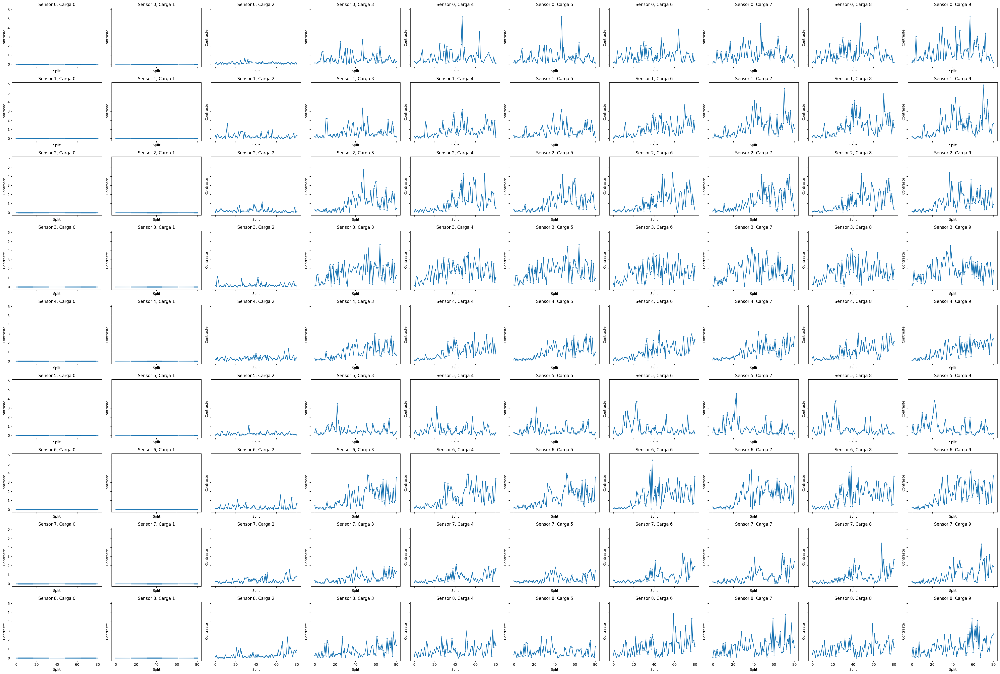

In [17]:
def plot_contraste_vs_split(datos_contraste):
    sensores = datos_contraste['sensor'].unique()
    cargas = datos_contraste['ensayo'].unique()
    
    fig, axes = plt.subplots(len(sensores), len(cargas), 
                             figsize=(4*len(cargas), 3*len(sensores)), 
                             sharex=True, sharey=True)

    if len(sensores) == 1:
        axes = [axes]
    if len(cargas) == 1:
        axes = [[ax] for ax in axes]

    for i, sensor in enumerate(sensores):
        for j, carga in enumerate(cargas):
            ax = axes[i][j]
            subset = datos_contraste[(datos_contraste['sensor']==sensor) & 
                                     (datos_contraste['ensayo']==carga)]
            ax.plot(subset['split'], subset['distancia_baseline'], marker='o', markersize=2)
            ax.set_title(f"Sensor {sensor}, Carga {carga}")
            ax.set_xlabel("Split")
            ax.set_ylabel("Contraste")

    plt.tight_layout()
    plt.show()

plot_contraste_vs_split(datos_contraste.query('latent_dim == 2 '))

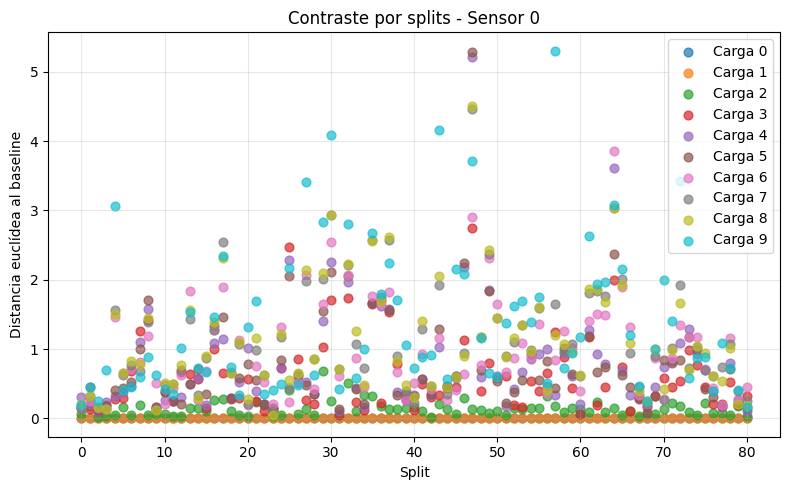

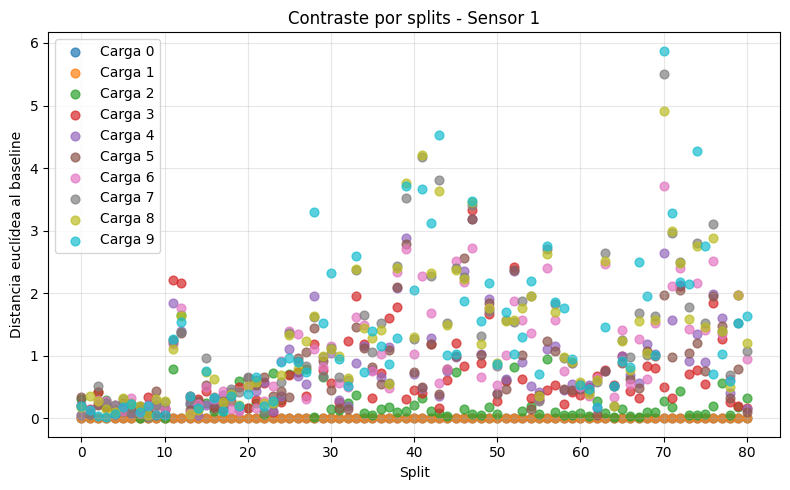

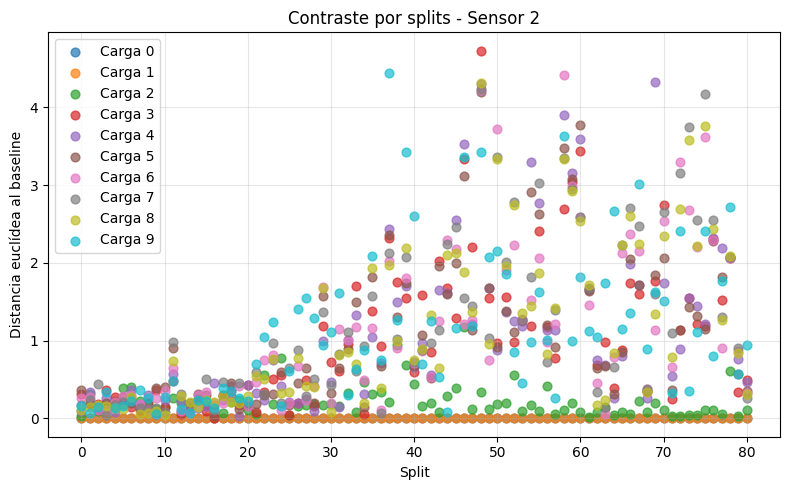

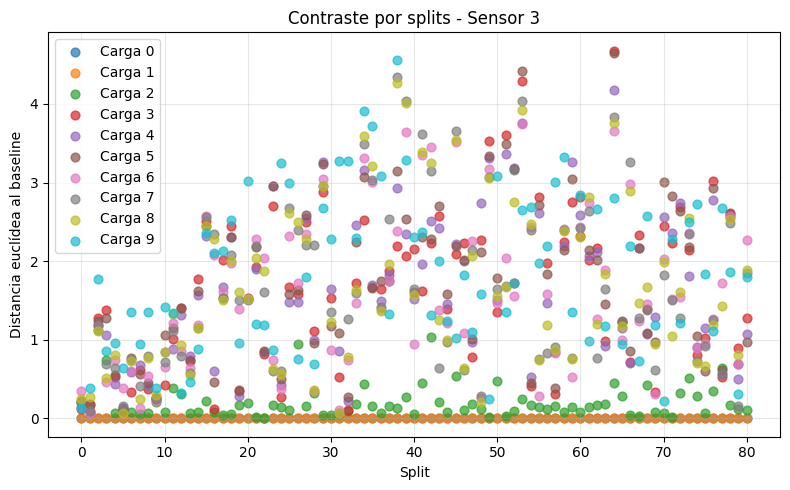

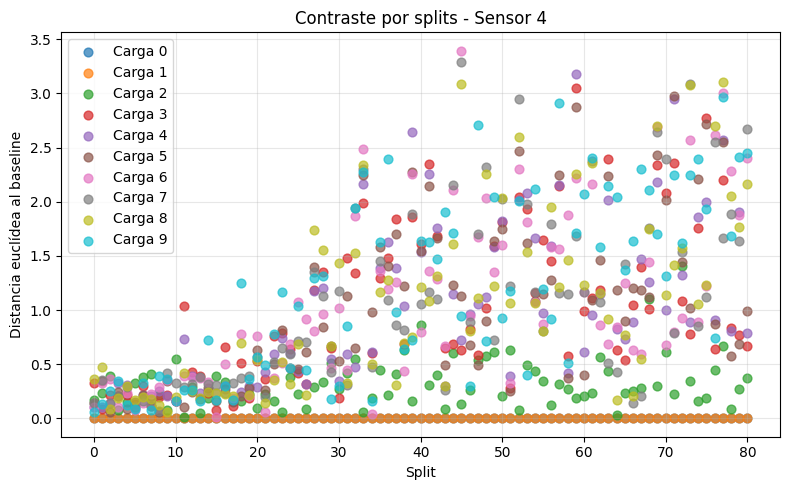

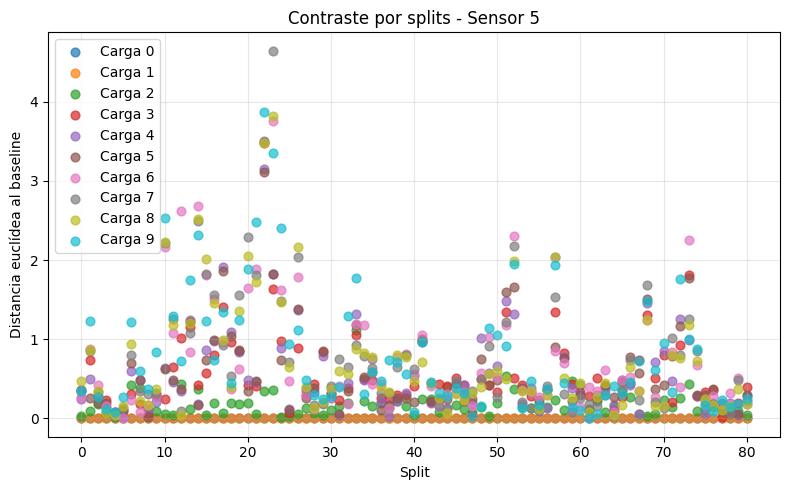

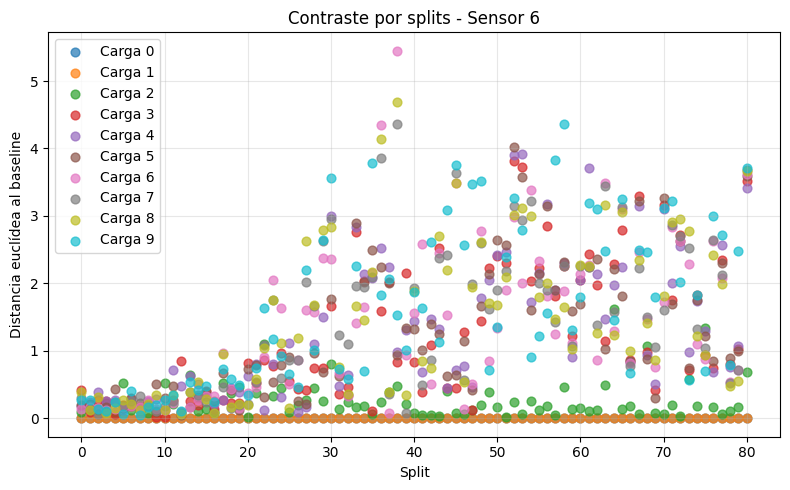

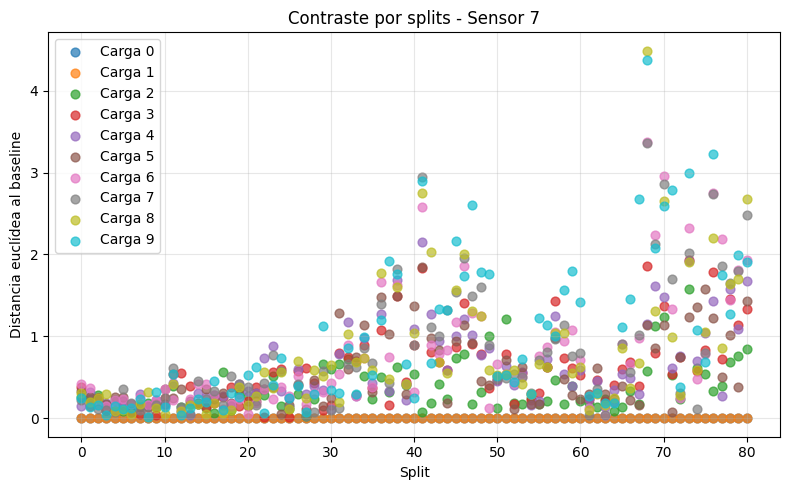

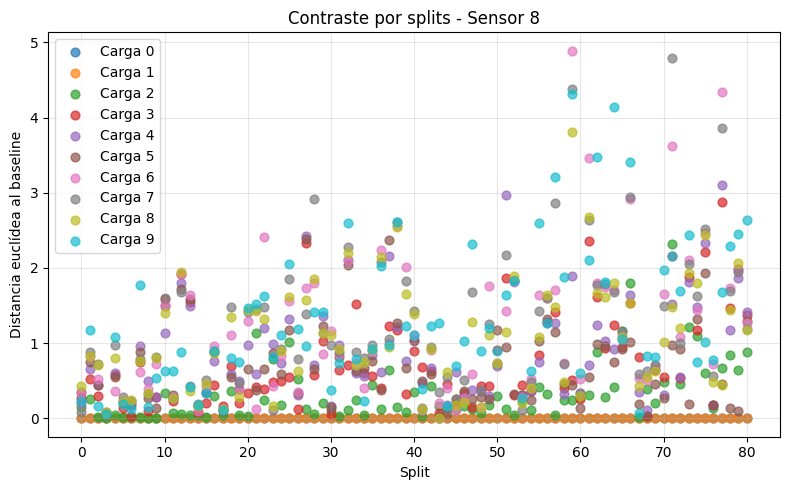

In [20]:
def plot_contraste_por_sensor_puntos(datos_contraste):
    sensores = datos_contraste['sensor'].unique()
    for sensor in sensores:
        subset = datos_contraste[datos_contraste['sensor'] == sensor]
        plt.figure(figsize=(8,5))

        for carga in sorted(subset['ensayo'].unique()):
            sub_carga = subset[subset['ensayo'] == carga].sort_values('split')
            x = sub_carga['split'].values
            y = sub_carga['distancia_baseline'].values
            plt.scatter(x, y, s=40, alpha=0.7, label=f"Carga {carga}")  # puntos

        plt.title(f"Contraste por splits - Sensor {sensor}")
        plt.xlabel("Split")
        plt.ylabel("Distancia euclídea al baseline")
        plt.grid(True, alpha=0.3)
        plt.legend()
        plt.tight_layout()
        plt.show()

plot_contraste_por_sensor_puntos(datos_contraste.query('latent_dim == 2 '))

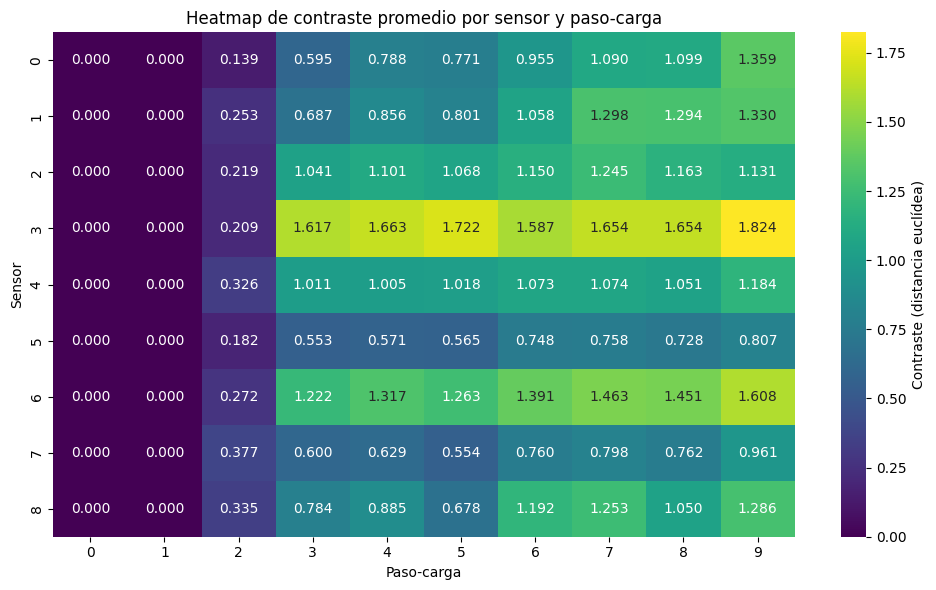

In [21]:
import seaborn as sns

def plot_heatmap(datos_contraste):
    """
    Heatmap de contraste promedio por sensor (filas) y paso-carga (columnas).
    
    datos_contraste: DataFrame con columnas ['sensor', 'paso_carga', 'split', 'contraste']
    """
    # Promediamos contraste a lo largo de los splits
    df_avg = datos_contraste.groupby(['sensor', 'ensayo'])['distancia_baseline'].mean().reset_index()
    
    # Pivot para formato heatmap: filas = sensor, columnas = paso_carga, valores = contraste promedio
    df_pivot = df_avg.pivot(index='sensor', columns='ensayo', values='distancia_baseline')
    
    plt.figure(figsize=(10, 6))
    sns.heatmap(df_pivot, annot=True, fmt=".3f", cmap='viridis', cbar_kws={'label': 'Contraste (distancia euclídea)'})
    plt.title('Heatmap de contraste promedio por sensor y paso-carga')
    plt.ylabel('Sensor')
    plt.xlabel('Paso-carga')
    plt.tight_layout()
    plt.show()

# 🔹 Uso
plot_heatmap(datos_contraste.query('latent_dim == 2 '))


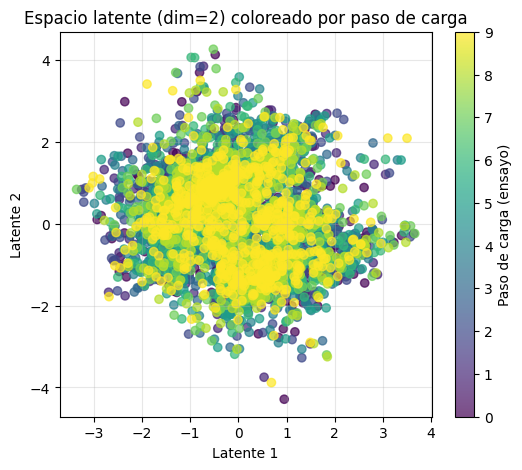

In [22]:
def plot_latente_por_paso(datos):
    """
    Visualización simple del espacio latente 2D (promedios),
    coloreado por paso de carga (ensayo).
    """
    # Filtrar filas donde el vector latente existe y tiene tamaño 2
    datos_validos = datos[datos['latente_promedio'].apply(lambda v: isinstance(v, (list, np.ndarray)) and len(v) == 2)]

    # Extraer vectores y pasos
    latentes = np.stack(datos_validos['latente_promedio'].apply(lambda v: np.array(v).reshape(-1)).values)
    pasos = datos_validos['ensayo'].values

    # Separar coordenadas
    x, y = latentes[:, 0], latentes[:, 1]

    # Plot
    plt.figure(figsize=(6, 5))
    scatter = plt.scatter(x, y, c=pasos, cmap="viridis", alpha=0.7)
    plt.colorbar(scatter, label="Paso de carga (ensayo)")
    plt.xlabel("Latente 1")
    plt.ylabel("Latente 2")
    plt.title("Espacio latente (dim=2) coloreado por paso de carga")
    plt.grid(True, alpha=0.3)
    plt.show()



plot_latente_por_paso(stats_datos_generados)

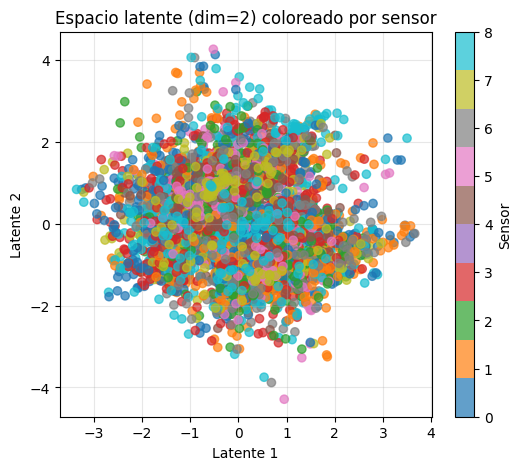

In [23]:
def plot_latente_por_sensor(datos):
    """
    Visualización simple del espacio latente 2D (promedios),
    coloreado por sensor.
    """
    # Filtrar filas donde el vector latente existe y tiene tamaño 2
    datos_validos = datos[datos['latente_promedio'].apply(lambda v: isinstance(v, (list, np.ndarray)) and len(v) == 2)]

    # Extraer vectores y sensores
    latentes = np.stack(datos_validos['latente_promedio'].apply(lambda v: np.array(v).reshape(-1)).values)
    sensores = datos_validos['sensor'].values

    # Separar coordenadas
    x, y = latentes[:, 0], latentes[:, 1]

    # Plot
    plt.figure(figsize=(6, 5))
    scatter = plt.scatter(x, y, c=sensores, cmap="tab10", alpha=0.7)  # cmap "tab10" funciona bien para categorías
    plt.colorbar(scatter, label="Sensor")
    plt.xlabel("Latente 1")
    plt.ylabel("Latente 2")
    plt.title("Espacio latente (dim=2) coloreado por sensor")
    plt.grid(True, alpha=0.3)
    plt.show()


plot_latente_por_sensor(stats_datos_generados)

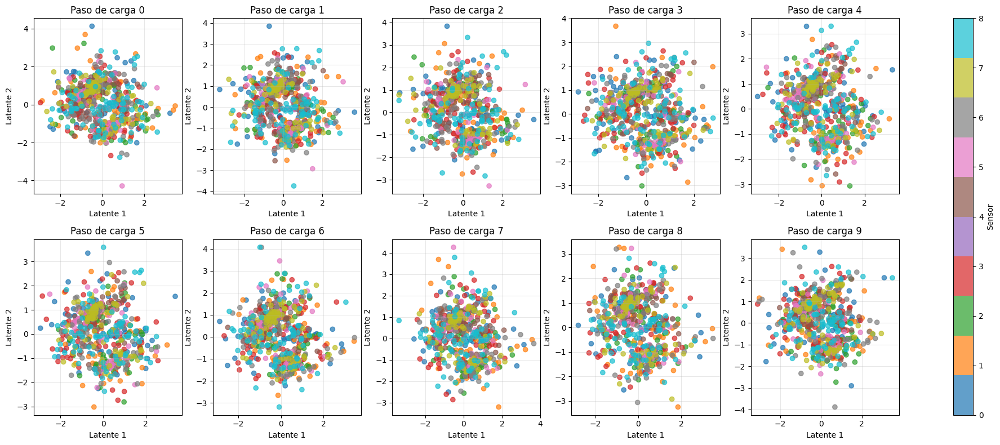

In [24]:
def plot_latente_por_paso_separado(datos):
    """
    Visualización del espacio latente 2D (promedios),
    mostrando un subplot por cada paso de carga.
    """
    # Filtrar filas válidas (vectores 2D)
    datos_validos = datos[datos['latente_promedio'].apply(lambda v: isinstance(v, (list, np.ndarray)) and len(v) == 2)]

    # Extraer valores
    latentes = np.stack(datos_validos['latente_promedio'].apply(lambda v: np.array(v).reshape(-1)).values)
    pasos = datos_validos['ensayo'].values
    sensores = datos_validos['sensor'].values

    # Número de pasos únicos
    pasos_unicos = np.unique(pasos)
    n_pasos = len(pasos_unicos)

    # Crear subplots (en cuadrícula)
    n_cols = 5 # puedes ajustar (4 columnas suele ir bien)
    n_rows = int(np.ceil(n_pasos / n_cols))

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(4*n_cols, 4*n_rows), squeeze=False)

    for idx, paso in enumerate(pasos_unicos):
        ax = axes[idx // n_cols, idx % n_cols]

        # Filtrar puntos de este paso
        mask = pasos == paso
        x, y = latentes[mask, 0], latentes[mask, 1]

        scatter = ax.scatter(x, y, c=sensores[mask], cmap="tab10", alpha=0.7)
        ax.set_title(f"Paso de carga {paso}")
        ax.set_xlabel("Latente 1")
        ax.set_ylabel("Latente 2")
        ax.grid(True, alpha=0.3)

    # Ajustar layout
    plt.tight_layout()
    cbar = fig.colorbar(scatter, ax=axes.ravel().tolist(), label="Sensor")
    plt.show()

plot_latente_por_paso_separado(stats_datos_generados)

In [29]:
curvas = datos_contraste.pivot_table(
        index=["latent_dim", "ensayo", "sensor"],
        columns="split",
        values="distancia_baseline"
    )
n = len(curvas)
curvas

split                           0         1         2         3         4   \
latent_dim ensayo sensor                                                     
2          0      0       0.000000  0.000000  0.000000  0.000000  0.000000   
                  1       0.000000  0.000000  0.000000  0.000000  0.000000   
                  2       0.000000  0.000000  0.000000  0.000000  0.000000   
                  3       0.000000  0.000000  0.000000  0.000000  0.000000   
                  4       0.000000  0.000000  0.000000  0.000000  0.000000   
...                            ...       ...       ...       ...       ...   
5          9      4       0.475956  0.996525  1.491117  0.392650  0.859680   
                  5       1.589956  1.247714  1.721372  0.641950  0.555552   
                  6       1.423929  1.316248  0.636885  0.737481  0.862273   
                  7       0.820944  0.452096  0.935079  0.584536  1.103309   
                  8       1.866016  1.981233  1.947631  1.016501  4.017578   

split                           5         6         7         8         9   \
latent_dim ensayo sensor                                                     
2          0      0       0.000000  0.000000  0.000000  0.000000  0.000000   
                  1       0.000000  0.000000  0.000000  0.000000  0.000000   
                  2       0.000000  0.000000  0.000000  0.000000  0.000000   
                  3       0.000000  0.000000  0.000000  0.000000  0.000000   
                  4       0.000000  0.000000  0.000000  0.000000  0.000000   
...                            ...       ...       ...       ...       ...   
5          9      4       0.665464  0.468240  0.753004  1.080096  1.228016   
                  5       0.902923  3.024673  1.464599  1.231252  0.946365   
                  6       0.404873  0.510950  0.883183  0.951964  0.689125   
                  7       0.817829  0.699472  0.491995  0.547082  1.023552   
                  8       1.076944  1.497492  2.482139  2.702095  3.493512   

split                     ...        71        72        73        74  \
latent_dim ensayo sensor  ...                                           
2          0      0       ...  0.000000  0.000000  0.000000  0.000000   
                  1       ...  0.000000  0.000000  0.000000  0.000000   
                  2       ...  0.000000  0.000000  0.000000  0.000000   
                  3       ...  0.000000  0.000000  0.000000  0.000000   
                  4       ...  0.000000  0.000000  0.000000  0.000000   
...                       ...       ...       ...       ...       ...   
5          9      4       ...  2.059772  0.789065  2.728495  3.158626   
                  5       ...  0.796958  1.351610  1.463547  1.106904   
                  6       ...  4.076569  2.554365  1.641700  2.989583   
                  7       ...  3.275045  1.252836  3.583031  2.191290   
                  8       ...  2.146675  3.028732  4.028962  1.392788   

split                           75        76        77        78        79  \
latent_dim ensayo sensor                                                     
2          0      0       0.000000  0.000000  0.000000  0.000000  0.000000   
                  1       0.000000  0.000000  0.000000  0.000000  0.000000   
                  2       0.000000  0.000000  0.000000  0.000000  0.000000   
                  3       0.000000  0.000000  0.000000  0.000000  0.000000   
                  4       0.000000  0.000000  0.000000  0.000000  0.000000   
...                            ...       ...       ...       ...       ...   
5          9      4       2.706761  1.940231  2.674602  2.625953  2.733604   
                  5       0.953097  0.369584  0.589932  0.666060  0.852596   
                  6       2.186728  3.463658  3.741172  2.166302  2.889459   
                  7       1.378506  4.043479  2.380723  2.189723  3.003071   
                  8       2.384265  2.275131  5.090096  3.381487  3.632392   

split

In [59]:
def dtw_distance(s, t, dist_func=lambda x, y: abs(x - y)):
    """
    Calcula DTW entre dos series s y t usando distancia euclídea simple.
    """
    n, m = len(s), len(t)
    DTW = np.full((n + 1, m + 1), np.inf)  # Inicializar con infinito
    DTW[0, 0] = 0

    for i in range(1, n + 1):
        for j in range(1, m + 1):
            cost = dist_func(s[i-1], t[j-1])
            DTW[i, j] = cost + min(
                DTW[i-1, j],    # inserción
                DTW[i, j-1],    # eliminación
                DTW[i-1, j-1]   # coincidencia
            )
    return DTW[n, m]

In [63]:
from scipy.stats import pearsonr

def calcular_metricas(datos_contraste):
    """
    Calcula Pearson y DTW entre curvas, ignorando ensayos baseline.
    DTW se calcula usando dtaidistance para mayor robustez.
    """
    # Reorganizar datos
    curvas = datos_contraste.pivot_table(
        index=["latent_dim", "ensayo", "sensor"],
        columns="split",
        values="distancia_baseline"
    )

    # Excluir baseline
    curvas = curvas[curvas.index.get_level_values('ensayo').isin([0, 1]) == False]

    resultados = []
    n = len(curvas)

    for i in range(n):
        for j in range(i + 1, n):
            curva_i = np.ravel(curvas.iloc[i].values)
            curva_j = np.ravel(curvas.iloc[j].values)

            # Pearson
            try:
                pearson, _ = pearsonr(curva_i, curva_j)
            except Exception:
                pearson = np.nan

            # DTW con dtaidistance
            try:
                dtw_dist = dtw_distance(curva_i, curva_j)
            except Exception:
                dtw_dist = np.nan

            resultados.append({
                "curva_i": curvas.index[i],
                "curva_j": curvas.index[j],
                "pearson": pearson,
                "dtw": dtw_dist
            })

    return pd.DataFrame(resultados)

metricas=calcular_metricas_dtw(datos_contraste)
# Guardar
# Convertir curvas a tuplas de int normales
metricas['curva_i'] = metricas['curva_i'].apply(lambda x: tuple(int(v) for v in x))
metricas['curva_j'] = metricas['curva_j'].apply(lambda x: tuple(int(v) for v in x))
metricas.to_csv("metricas.csv", index=False)

In [64]:
# Cargar
metricas = pd.read_csv("metricas.csv")
metricas

,curva_i,curva_j,pearson,dtw
0,"(2, 2, 0)","(2, 2, 1)",0.050353,9.903340
1,"(2, 2, 0)","(2, 2, 2)",0.195381,8.780835
2,"(2, 2, 0)","(2, 2, 3)",-0.256802,8.872073
3,"(2, 2, 0)","(2, 2, 4)",0.139357,11.705684
4,"(2, 2, 0)","(2, 2, 5)",-0.115704,6.885034
...,...,...,...,...
23215,"(5, 9, 5)","(5, 9, 7)",-0.341886,54.708889
23216,"(5, 9, 5)","(5, 9, 8)",-0.224324,76.927954
23217,"(5, 9, 6)","(5, 9, 7)",0.515495,44.343834
23218,"(5, 9, 6)","(5, 9, 8)",0.167921,51.215041


In [65]:
# Lista de curvas únicas
curvas_unicas = sorted(list(set(metricas['curva_i']).union(metricas['curva_j'])))

# Crear un DataFrame vacío
pearson_matrix = pd.DataFrame(index=curvas_unicas, columns=curvas_unicas, dtype=float)
dtw_matrix = pd.DataFrame(index=curvas_unicas, columns=curvas_unicas, dtype=float)

# Rellenar las matrices
for _, row in metricas.iterrows():
    i = row['curva_i']
    j = row['curva_j']
    pearson_matrix.loc[i, j] = row['pearson']
    pearson_matrix.loc[j, i] = row['pearson']  # simétrica

    dtw_matrix.loc[i, j] = row['dtw']
    dtw_matrix.loc[j, i] = row['dtw']          # simétrica

# Opcional: rellenar diagonales
np.fill_diagonal(pearson_matrix.values, 1.0)
np.fill_diagonal(dtw_matrix.values, 0.0)


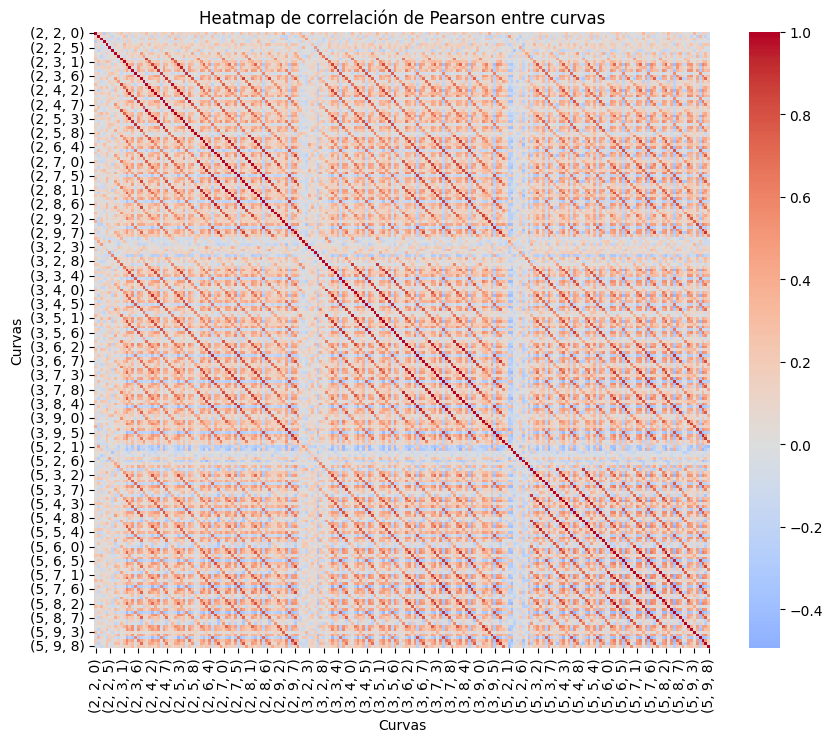

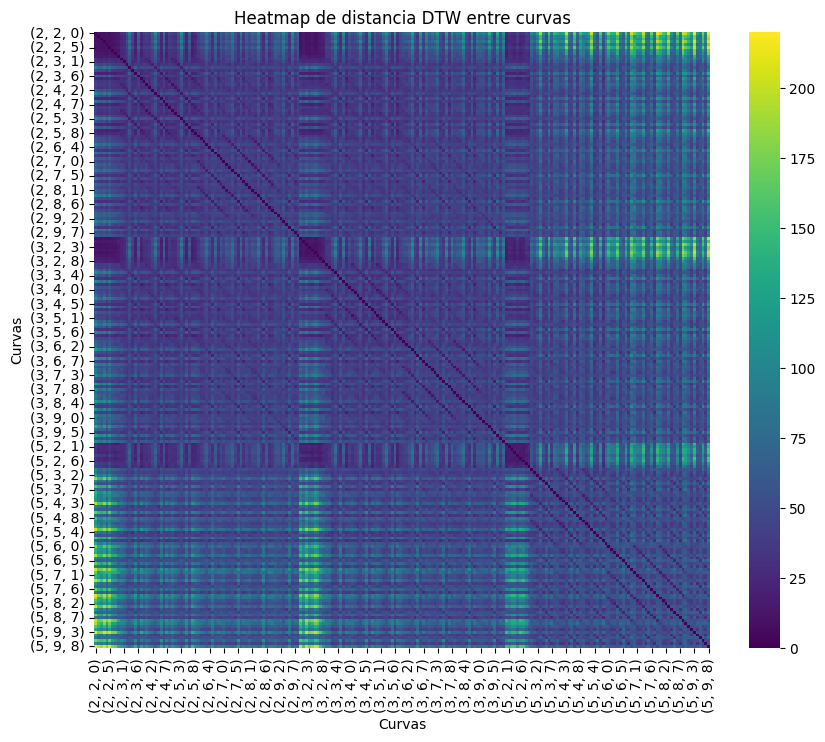

In [67]:
import seaborn as sns

# Heatmap de Pearson
plt.figure(figsize=(10, 8))
sns.heatmap(pearson_matrix, cmap="coolwarm", center=0, square=True)
plt.title("Heatmap de correlación de Pearson entre curvas")
plt.xlabel("Curvas")
plt.ylabel("Curvas")
plt.show()

# Heatmap de DTW
plt.figure(figsize=(10, 8))
sns.heatmap(dtw_matrix, cmap="viridis", square=True)
plt.title("Heatmap de distancia DTW entre curvas")
plt.xlabel("Curvas")
plt.ylabel("Curvas")
plt.show()


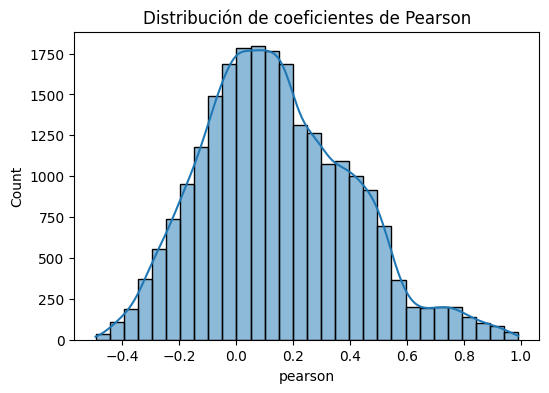

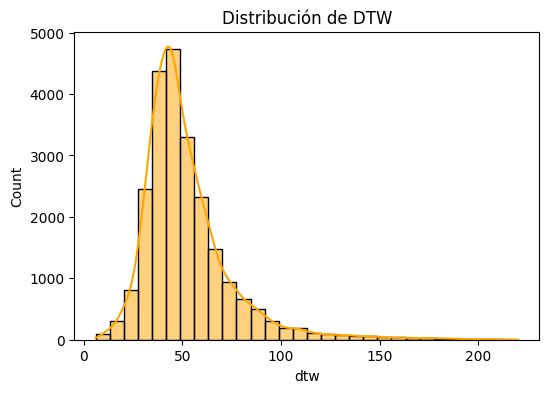

In [69]:
plt.figure(figsize=(6,4))
sns.histplot(metricas['pearson'].dropna(), bins=30, kde=True)
plt.title("Distribución de coeficientes de Pearson")
plt.show()

plt.figure(figsize=(6,4))
sns.histplot(metricas['dtw'].dropna(), bins=30, kde=True, color='orange')
plt.title("Distribución de DTW")
plt.show()


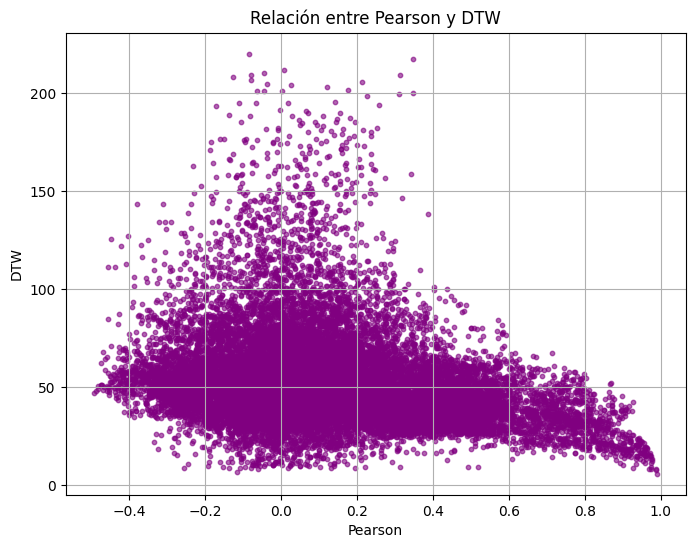

In [83]:
# --- Scatter plot Pearson vs DTW ---
plt.figure(figsize=(8,6))
plt.scatter(metricas['pearson'], metricas['dtw'], s=10, alpha=0.6, color='purple')
plt.xlabel('Pearson')
plt.ylabel('DTW')
plt.title('Relación entre Pearson y DTW')
plt.grid(True)
plt.show()